# Ross Sea synthetic gravity inversion

Here we try to recover the true bathymetry with a gravity inversion for a portion of the Ross Sea. We create a synthetic gravity dataset which is the forward gravity of 3 density contrasts across real topographic surfaces. The first is the air-water surface, from BedMap2. The second is the water-sediment (bathymetry) surface, also from BedMap2. The third is the sediment-basement, from the ANTOSTRAT seismic surveys. We use three version of this synthetic observed gravity; 1) a "perfect" gravity survey at a constant 1000m above sea level, which stations evenly spacing in a 2km grid over the region, with and without 2% gaussian noise added, 2) a resampled gravity survey at 10km spacing, with and with 2% noise, and 3) a synthetic airborne survey, with N-S and E-W flight lines at a constant 1000m altitude, with several gaps between lines. We create a low-resolution bathymetry by samping the true bathymetry at 110 random "constraint" points, and regridding the surface with just these values. In an Antarctic setting, these points represent single seismic survey locations which image the bathymetry surface.

All of these processes are included in the notebook `Ross_Sea_synthetic_model.ipynb`.  While not included as a layer in the inversion, the forward gravity of the basement is included in the observed gravity. This field represents the regional gravity signal from factors such as long wavelength crustal thickness variations. 

import packages

In [1]:
%load_ext autoreload
%autoreload 2
%load_ext snakeviz

import sys

from RIS_gravity_inversion import regional, synthetic, plotting, optimization
import RIS_gravity_inversion.inversion as inv
import RIS_gravity_inversion.utils as inv_utils

import copy
from antarctic_plots import utils, regions, maps, fetch, profile
import zarr
import harmonica as hm
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import verde as vd
import scipy as sp
import pvxarray
import rioxarray
import pygmt
import plotly.graph_objects as go
import optuna
from optuna.storages import JournalStorage, JournalFileStorage
import warnings
import itertools

import os

# Load data

## topographic layers
* 2 full resolution layers 
* low resolution bed

In [2]:
surface = xr.open_zarr("../synthetic_data/Ross_Sea_surface.zarr").z

bed = xr.open_zarr("../synthetic_data/Ross_Sea_bed.zarr").z

lowres_bed = xr.open_zarr("../synthetic_data/Ross_Sea_lowres_bed.zarr").z

print(utils.get_grid_info(surface))
print(utils.get_grid_info(bed))
print(utils.get_grid_info(lowres_bed))
lowres_bed

/home/tankerma/miniconda/envs/RIS_gravity_inversion/lib/python3.9/site-packages/xarray/backends/plugins.py:71: RuntimeWarning: Engine 'cfgrib' loading failed:
Cannot find the ecCodes library
  warnings.warn(f"Engine {name!r} loading failed:\n{ex}", RuntimeWarning)


(5000.0, [-300000.0, 250000.0, -1900000.0, -1500000.0], -65.658416748, -55.9449195862, 'g')
(5000.0, [-300000.0, 250000.0, -1900000.0, -1500000.0], -4115.15136719, -267.01361084, 'g')
(5000.0, [-300000.0, 250000.0, -1900000.0, -1500000.0], -3885.21142578, -305.317504883, 'g')


<xarray.DataArray 'z' (northing: 81, easting: 111)>
dask.array<open_dataset-8b6f92873d6dd6be48e55a4c9d24c65bz, shape=(81, 111), dtype=float32, chunksize=(81, 111), chunktype=numpy.ndarray>
Coordinates:
  * easting   (easting) float64 -3e+05 -2.95e+05 -2.9e+05 ... 2.45e+05 2.5e+05
  * northing  (northing) float64 -1.9e+06 -1.895e+06 ... -1.505e+06 -1.5e+06
Attributes:
    actual_range:  [-3885.21142578125, -305.3175048828125]
    long_name:     z

## gravity data
* full resolution gravity data
* 10km resampled gravity data
* airborne survey gravity data

* full resolution forward gravity of the regional field (basement)

In [3]:
# true regional gravity anomaly
true_regional_grav = xr.open_zarr(
    "../synthetic_data/Ross_Sea_forward_grav.zarr"
).basement

# full resolution gravity point data
full_res_grav = pd.read_csv(
    "../synthetic_data/Ross_Sea_full_res_gravity.csv.gz",
    sep=",",
    header="infer",
    index_col=None,
    compression="gzip",
)

# sampled gravity point data
sampled_grav = pd.read_csv(
    "../synthetic_data/Ross_Sea_sampled_gravity.csv.gz",
    sep=",",
    header="infer",
    index_col=None,
    compression="gzip",
)

# airborne survey gravity point data
airborne_survey_grav = pd.read_csv(
    "../synthetic_data/Ross_Sea_airborne_survey_gravity.csv.gz",
    sep=",",
    header="infer",
    index_col=None,
    compression="gzip",
)

# Set region and parameters

Use the same regions and parameters as `Ross_Sea synthetic_model.ipynb`

In [4]:
layer_spacing, inversion_region, _, _, registration = utils.get_grid_info(bed)

# set gravity observation parameters
grav_observation_height = 1e3
sampled_grav_spacing = 20e3
airborne_grav_spacing = 1e3

buffer_region = utils.alter_region(
    inversion_region,
    buffer=0,
)[1]

print(f"layer spacing: {layer_spacing}m")
print(f"registration: {registration}")
print("inversion region = ", inversion_region)
print("buffer region = ", buffer_region)

layer spacing: 5000.0m
registration: g
inversion region =  [-300000.0, 250000.0, -1900000.0, -1500000.0]
buffer region =  [-300000, 250000, -1900000, -1500000]


### prep grav data

In [5]:
full_res_grav = inv_utils.prep_grav_data(
    full_res_grav,
    region=inversion_region,
    input_grav_name="forward_total",
    input_coord_names=("easting", "northing", "upward"),
)

sampled_grav = inv_utils.prep_grav_data(
    sampled_grav,
    region=inversion_region,
    input_grav_name="Gobs",
    input_coord_names=("easting", "northing", "upward"),
)

airborne_survey_grav = inv_utils.prep_grav_data(
    airborne_survey_grav,
    region=inversion_region,
    input_grav_name="Gobs",
    input_coord_names=("easting", "northing", "upward"),
)
print(f"full resolution gravity: {len(full_res_grav)} points")
print(f"sampled gravity: {len(sampled_grav)} points")
print(f"airborne survey gravity: {len(airborne_survey_grav)} points")

print(f"gravity avg. elevation: {int(np.nanmean(full_res_grav.upward))}")

full resolution gravity: 8991 points
sampled gravity: 609 points
airborne survey gravity: 16800 points
gravity avg. elevation: 1000


## constraint points

In [6]:
# load constraint points into a dataframe
constraint_points_all = pd.read_csv(
    "../synthetic_data/Ross_Sea_synthetic_constraints.csv.gz",
    sep=",",
    header="infer",
    index_col=None,
    compression="gzip",
)

# ensure all points are within inversion region
constraint_points = utils.points_inside_region(
    constraint_points_all, inversion_region, names=("easting", "northing")
)

# set conventional names
print(f"bathymetry control points:{len(constraint_points)}")
constraint_points.head()

bathymetry control points:110


,easting,northing,upward
0,-60202.803822,-1.794489e+06,-672.470024
1,-285740.572495,-1.534434e+06,-1704.880401
2,2314.362833,-1.732106e+06,-288.343065
3,-60572.684060,-1.683923e+06,-472.233651
4,-68797.708852,-1.656623e+06,-477.404576


In [7]:
# %%timeit -r 5
tension_0 = pygmt.surface(
    data=constraint_points,
    region=inversion_region,
    spacing=layer_spacing,
    # registration=registration,
    T=0,
    verbose="q",
)

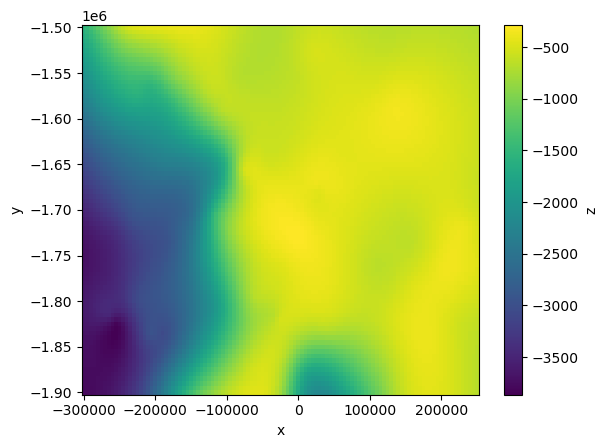

In [8]:
tension_0.plot()

In [9]:
# %%timeit -r 5
tension_1 = pygmt.surface(
    data=constraint_points,
    region=inversion_region,
    spacing=layer_spacing,
    # registration=registration,
    T=1,
    verbose="q",
)

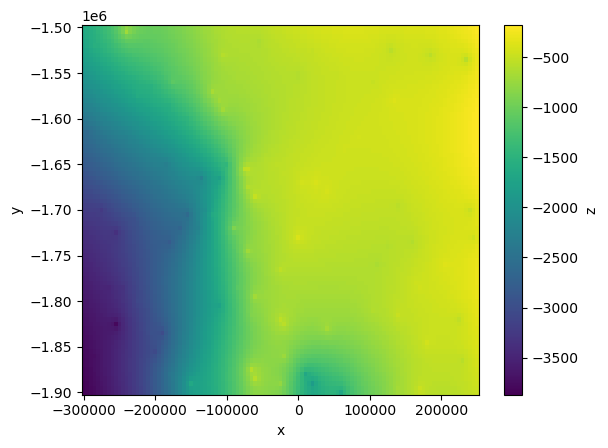

In [10]:
tension_1.plot()

In [11]:
# %%timeit -r 5
spline = vd.Spline(damping=1e-10, mindist=100e3)
spline.fit(
    (constraint_points.easting, constraint_points.northing), constraint_points.upward
)
verde_spline = spline.grid(region=inversion_region, spacing=layer_spacing).scalars

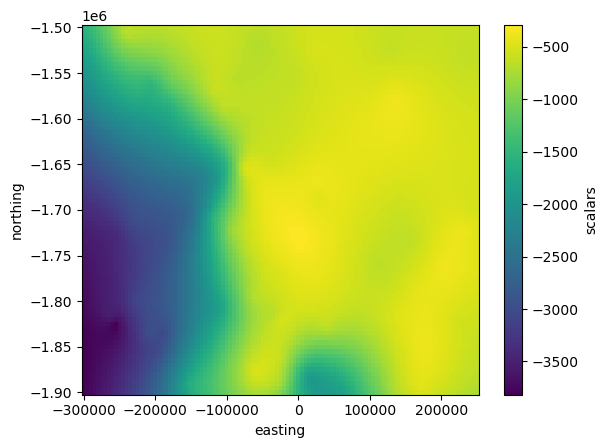

In [12]:
verde_spline.plot()

In [ ]:
spline = vd.SplineCV(
    dampings=np.logspace(-6, 3, num=10),
    mindists=np.linspace(1e3, 100e3, 10),
    delayed=True,
)
spline.fit(
    (constraint_points.easting, constraint_points.northing), constraint_points.upward
)
best_spline = spline.grid(region=inversion_region, spacing=layer_spacing).scalars

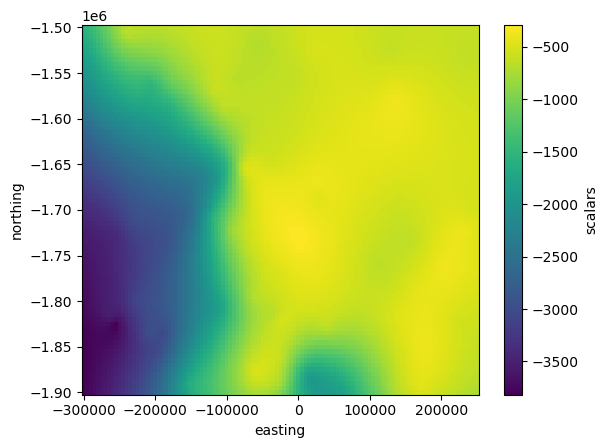

In [25]:
best_spline.plot()

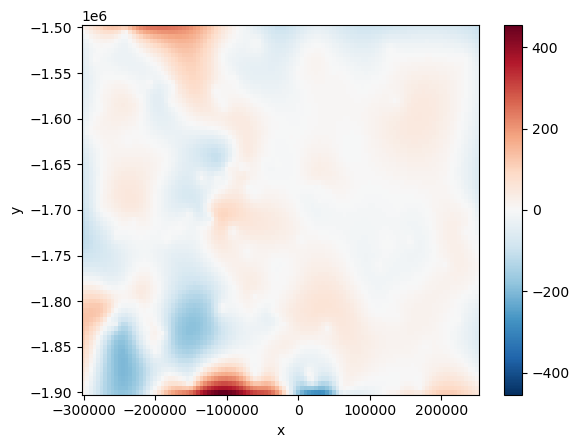

In [34]:
(tension_0 - best_spline.scalars.rename({"easting": "x", "northing": "y"})).plot()

# Full resolution observed gravity

## grid with eq sources
We need gravity data with a spacing similar to the spacing we desire for the topography. To achieve this, we use the equivalent source technique to re-grid the gravity data at a constant spacing and observation height. 

In [ ]:
# dampings = np.logspace(-4, 4, num=10)
# depths = np.linspace(1e3, 100e3, 10)

# parameter_sets = [
#     dict(damping=combo[0], depth=combo[1])
#     for combo in itertools.product(dampings, depths)
# ]
# print("Number of combinations:", len(parameter_sets))

NameError: name 'np' is not defined

In [26]:
# full_res_eq_best, full_res_eq_grid, full_res_eq_df = inv_utils.eq_sources_best(
#     parameter_sets = parameter_sets,
#     coordinates = (full_res_grav.easting, full_res_grav.northing, full_res_grav.upward),
#     data = full_res_grav.Gobs,
#     region = inversion_region,
#     spacing = layer_spacing,
#     block_size = layer_spacing*2,
#     depth_type="constant",
# )

# sampled_eq_best, sampled_eq_grid, sampled_eq_df = inv_utils.eq_sources_best(
#     parameter_sets = parameter_sets,
#     coordinates = (sampled_grav.easting, sampled_grav.northing, sampled_grav.upward),
#     data = sampled_grav.Gobs,
#     region = inversion_region,
#     spacing = layer_spacing,
#     block_size = layer_spacing*2,
#     depth_type="constant",
# )

# airborne_survey_eq_best, airborne_survey_eq_grid, airborne_survey_eq_df = inv_utils.eq_sources_best(
#     parameter_sets = parameter_sets,
#     coordinates = (airborne_survey_grav.easting, airborne_survey_grav.northing, airborne_survey_grav.upward),
#     data = airborne_survey_grav.Gobs,
#     region = inversion_region,
#     spacing = layer_spacing,
#     block_size = layer_spacing*2,
#     depth_type="constant",
# )

In [27]:
# full_res_grav = full_res_eq_df.rename(columns={"predicted_grav":"Gobs"})
# sampled_grav = sampled_eq_df.rename(columns={"predicted_grav":"Gobs"})
# airborne_survey_grav = airborne_survey_eq_df.rename(columns={"predicted_grav":"Gobs"})
# full_res_grav

## Bouguer correction

The `observed gravity` includes a gravitational signal from density contrast of the water surface, the bathymetry, and the basement. Since we want to invert for the bathymetry, we need to remove the components of this gravity from the water surface and the regional field from the basement. Here we show how to remove the water surface component, and later will show how to remove the regional component.

To do this, we build a series of vertical prisms around a flat reference, which we take to be the mean value of the surface. The prisms extend above or below this reference, towards the water surface. Prisms above the reference are assigned a positive density contrast ($\rho_{water}$ - $\rho_{air}$), while prisms below the reference are assigned a negative density contrast ($\rho_{air}$ - $\rho_{water}$). This is shown in b) and c) of the below figure.

At each stage of the inversion, the we ensure the updated bathymetry doesn't intersect the water surface. This means the water surface density contrast will be constant throughout the inversion, and can thus be calculated and accounted for only once, at the beginning. 

Here, we calculate the forward gravity of this density contrast, and remove it from the observed gravity to make a `corrected observed gravity`. 

<img src="../figures/synthetic_model_simple_2layer.svg" width="1000"/>

### Water prisms

In [133]:
# create prisms around Surface
# positive densities above reference, negative below
water_prisms = inv_utils.grids_to_prisms(
    surface=surface,
    reference=surface.values.mean(),
    density=xr.where(surface >= surface.values.mean(), 1030, -1030),
)

# plotting.show_prism_layers(
#     [water_prisms],
#     cmap="viridis",
#     color_by="density",
#     # color_by="thickness",
#     zscale=100,
#     clip_box=False,
#     log_scale=False,
# )

### Water gravity

In [134]:
# calculate gravity of layer1
water_grav_grid, water_grav_df = inv_utils.forward_grav_of_prismlayer(
    [water_prisms],
    full_res_grav,
    names=["water_prisms"],
    remove_median=False,
    progressbar=True,
    plot=False,
)

full_res_grav["water_forward"] = water_grav_df.forward_total

# subtract from observed gravity
full_res_grav["Gobs_corr"] = full_res_grav.Gobs - full_res_grav.water_forward

# center on 0
# full_res_grav['Gobs_corr'] -= full_res_grav['Gobs_corr'].median()

# grid the results
water_forward = (
    full_res_grav.set_index(["northing", "easting"]).to_xarray().water_forward
)
Gobs_corr = full_res_grav.set_index(["northing", "easting"]).to_xarray().Gobs_corr

# center on 0
# water_forward -= np.median(water_forward)
# Gobs_corr -= np.median(Gobs_corr)
full_res_grav

  0%|                                                  | 0/8991 [00:00<?, ?it/s]

,northing,easting,basement,bed,Gobs,surface,upward,water_forward,Gobs_corr
0,-1900000.0,-300000.0,-8.259026,-69.871502,977953.723634,-0.145838,1000.0,-0.145838,977953.869472
1,-1900000.0,-295000.0,-10.356904,-84.918117,977936.565582,-0.159397,1000.0,-0.159397,977936.724979
2,-1900000.0,-290000.0,-10.960204,-88.515571,977932.361072,-0.163153,1000.0,-0.163153,977932.524225
3,-1900000.0,-285000.0,-11.067594,-89.625441,977931.141160,-0.165805,1000.0,-0.165805,977931.306965
4,-1900000.0,-280000.0,-10.974522,-90.062903,977930.794771,-0.167805,1000.0,-0.167805,977930.962576
...,...,...,...,...,...,...,...,...,...
8986,-1500000.0,230000.0,1.685087,22.793155,978056.627830,0.149589,1000.0,0.149589,978056.478241
8987,-1500000.0,235000.0,3.003687,22.904124,978058.055458,0.147648,1000.0,0.147648,978057.907811
8988,-1500000.0,240000.0,3.900581,22.313636,978058.360442,0.146225,1000.0,0.146225,978058.214217
8989,-1500000.0,245000.0,4.240205,21.920340,978058.304724,0.144179,1000.0,0.144179,978058.160545


returning original grid
returning original grid


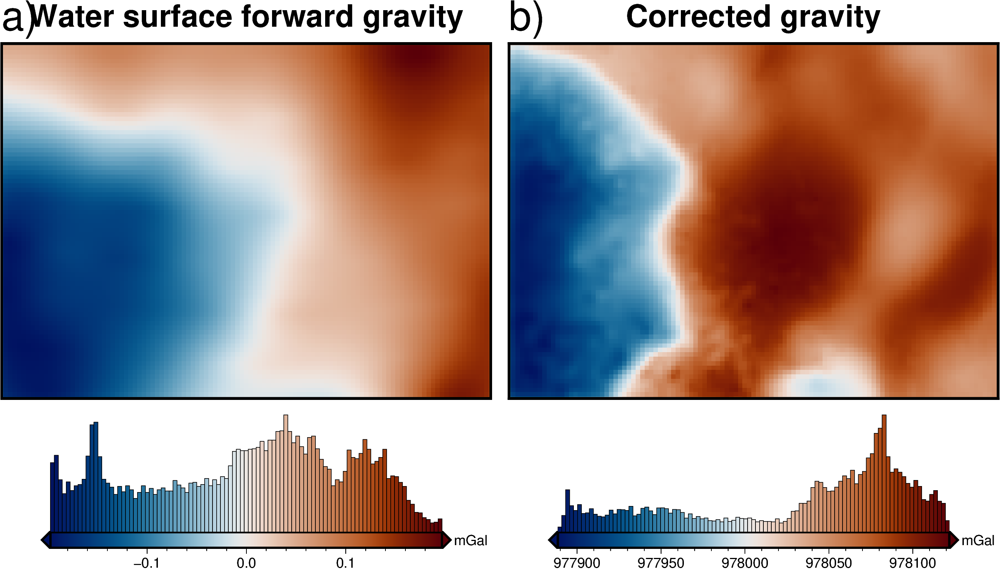

In [135]:
# plot Layer 1 gravity
fig = maps.plot_grd(
    grid=water_forward,
    fig_height=8,
    cmap="vik",
    region=buffer_region,
    title="Water surface forward gravity",
    cbar_unit="mGal",
    show_region=inversion_region,
    hist=True,
    cbar_yoffset=3,
)
fig.text(
    position="TL",
    justify="BL",
    text="a)",
    font="26p,Helvetica,black",
    offset="j0/.3",
    no_clip=True,
)
# plot corrected gravity
fig = maps.plot_grd(
    grid=Gobs_corr,
    fig_height=8,
    cmap="vik",
    region=buffer_region,
    title="Corrected gravity",
    cbar_unit="mGal",
    show_region=inversion_region,
    hist=True,
    cbar_yoffset=3,
    fig=fig,
    origin_shift="xshift",
)
fig.text(
    position="TL",
    justify="BL",
    text="b)",
    font="26p,Helvetica,black",
    offset="j0/.3",
    no_clip=True,
)
fig.show()

## Gravity misfit

The `gravity misfit` is defined as the difference between the observed and predicted gravity:

$G_{misfit} = G_{obs} - G_{forward}$ 

To determine $G_{misfit}$, we need to forward model the gravitational effect of the low-resolution bathymetry density contrast. This will be the input into our inversion.


### Bed prisms

In [23]:
# create prisms around low-res bathymetry
# positive densities above reference, negative below
bed_prisms = inv_utils.grids_to_prisms(
    surface=lowres_bed,
    reference=lowres_bed.values.mean(),
    density=xr.where(
        lowres_bed >= lowres_bed.values.mean(), 2300 - 1030, -(2300 - 1030)
    ),
)

# plotting.show_prism_layers(
#     [layer2_prisms],
#     cmap="viridis",
#     color_by="density",
#     # color_by="thickness",
#     zscale=100,
#     clip_box=False,
#     log_scale=False,
# )

### Bed gravity

In [137]:
# calculate gravity of layer1
bed_grav_grid, bed_grav_df = inv_utils.forward_grav_of_prismlayer(
    [bed_prisms],
    full_res_grav,
    names=["bed_prisms"],
    remove_median=False,
    progressbar=True,
    plot=False,
)

full_res_grav["bed_forward"] = bed_grav_df.forward_total

# grid the results
bed_forward = full_res_grav.set_index(["northing", "easting"]).to_xarray().bed_forward

# center on 0
# bed_forward -= np.median(bed_forward)

full_res_grav

  0%|                                                  | 0/8991 [00:00<?, ?it/s]

,northing,easting,basement,bed,Gobs,surface,upward,water_forward,Gobs_corr,bed_forward
0,-1900000.0,-300000.0,-8.259026,-69.871502,977953.723634,-0.145838,1000.0,-0.145838,977953.869472,-70.387021
1,-1900000.0,-295000.0,-10.356904,-84.918117,977936.565582,-0.159397,1000.0,-0.159397,977936.724979,-85.639679
2,-1900000.0,-290000.0,-10.960204,-88.515571,977932.361072,-0.163153,1000.0,-0.163153,977932.524225,-89.216505
3,-1900000.0,-285000.0,-11.067594,-89.625441,977931.141160,-0.165805,1000.0,-0.165805,977931.306965,-90.126421
4,-1900000.0,-280000.0,-10.974522,-90.062903,977930.794771,-0.167805,1000.0,-0.167805,977930.962576,-90.065283
...,...,...,...,...,...,...,...,...,...,...
8986,-1500000.0,230000.0,1.685087,22.793155,978056.627830,0.149589,1000.0,0.149589,978056.478241,30.243463
8987,-1500000.0,235000.0,3.003687,22.904124,978058.055458,0.147648,1000.0,0.147648,978057.907811,30.526676
8988,-1500000.0,240000.0,3.900581,22.313636,978058.360442,0.146225,1000.0,0.146225,978058.214217,30.779532
8989,-1500000.0,245000.0,4.240205,21.920340,978058.304724,0.144179,1000.0,0.144179,978058.160545,30.679880


### Misfit

In [138]:
full_res_grav = inv.misfit(
    input_grav=full_res_grav,
    input_forward_column="bed_forward",
    input_grav_column="Gobs_corr",
)

DC shifted observed gravity by 978030.0mGal to match forward gravity.


### Save and load results

In [139]:
full_res_grav.to_csv(
    "../synthetic_data/Ross_Sea_starting_model_forward_gravity.csv.gz",
    sep=",",
    na_rep="",
    header=True,
    index=False,
    encoding="utf-8",
    compression="gzip",
)

In [8]:
full_res_grav = pd.read_csv(
    "../synthetic_data/Ross_Sea_starting_model_forward_gravity.csv.gz",
    sep=",",
    header="infer",
    index_col=None,
    compression="gzip",
)

full_res_grav

,northing,easting,basement,bed,Gobs,surface,upward,water_forward,Gobs_corr,bed_forward,Gobs_corr_shift,misfit
0,-1900000.0,-300000.0,-8.259026,-69.871502,977953.723634,-0.145838,1000.0,-0.145838,977953.869472,-70.387021,-75.821052,-5.434031
1,-1900000.0,-295000.0,-10.356904,-84.918117,977936.565582,-0.159397,1000.0,-0.159397,977936.724979,-85.639679,-92.965545,-7.325866
2,-1900000.0,-290000.0,-10.960204,-88.515571,977932.361072,-0.163153,1000.0,-0.163153,977932.524225,-89.216505,-97.166299,-7.949794
3,-1900000.0,-285000.0,-11.067594,-89.625441,977931.141160,-0.165805,1000.0,-0.165805,977931.306965,-90.126421,-98.383559,-8.257138
4,-1900000.0,-280000.0,-10.974522,-90.062903,977930.794771,-0.167805,1000.0,-0.167805,977930.962576,-90.065283,-98.727948,-8.662666
...,...,...,...,...,...,...,...,...,...,...,...,...
8986,-1500000.0,230000.0,1.685087,22.793155,978056.627830,0.149589,1000.0,0.149589,978056.478241,30.243463,26.787717,-3.455746
8987,-1500000.0,235000.0,3.003687,22.904124,978058.055458,0.147648,1000.0,0.147648,978057.907811,30.526676,28.217287,-2.309390
8988,-1500000.0,240000.0,3.900581,22.313636,978058.360442,0.146225,1000.0,0.146225,978058.214217,30.779532,28.523693,-2.255839
8989,-1500000.0,245000.0,4.240205,21.920340,978058.304724,0.144179,1000.0,0.144179,978058.160545,30.679880,28.470021,-2.209858


returning original grid
returning original grid
returning original grid
returning original grid
returning original grid


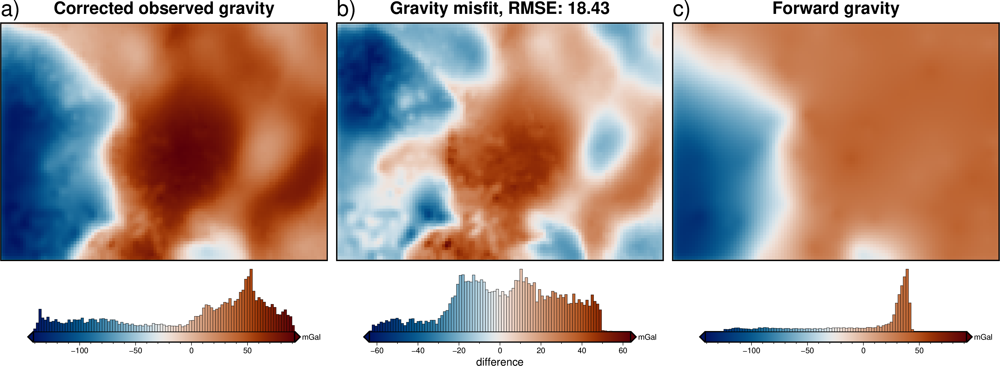

In [141]:
plotting.misfit_plotting(
    full_res_grav,
    grav_spacing=layer_spacing,
    plot_type="pygmt",
    input_forward_column="bed_forward",
    input_grav_column="Gobs_corr_shift",
)

returning original grid


grd2cpt [ERROR]: Making a continuous cpt from a discrete cpt may give unexpected results!


returning original grid


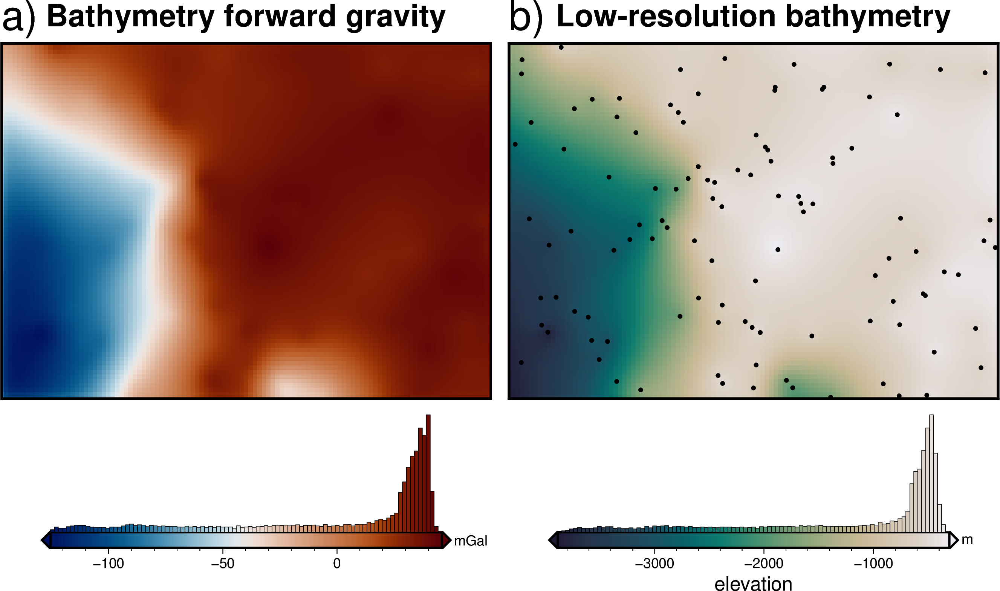

In [142]:
# plot layer 2 gravity
fig = maps.plot_grd(
    grid=bed_forward,
    fig_height=8,
    cmap="vik",
    region=buffer_region,
    title="Bathymetry forward gravity",
    cbar_unit="mGal",
    show_region=inversion_region,
    hist=True,
    cbar_yoffset=3,
)
fig.text(
    position="TL",
    justify="BL",
    text="a)",
    font="26p,Helvetica,black",
    offset="j0/.3",
    no_clip=True,
)
# plot layer 2 topography
fig = maps.plot_grd(
    grid=lowres_bed,
    fig_height=8,
    cmap="rain",
    reverse_cpt=True,
    region=buffer_region,
    grd2cpt=True,
    title="Low-resolution bathymetry",
    cbar_label="elevation",
    cbar_unit="m",
    show_region=inversion_region,
    hist=True,
    cbar_yoffset=3,
    fig=fig,
    origin_shift="xshift",
    points=constraint_points.rename(columns={"easting": "x", "northing": "y"}),
    points_style="c0.1c",
)
fig.text(
    position="TL",
    justify="BL",
    text="b)",
    font="26p,Helvetica,black",
    offset="j0/.3",
    no_clip=True,
)
fig.show()

## Regional - Residual seperation

The `corrected observed gravity` is the combination of the signal from the density contrasts of `bathymetry` and `basement`. Both of these signals contain long-wavelength components, since both surface have long-wavelength topographic features. The `bathymetry` signal also contains short-wavelength components. Deeper in the crust, further away from the gravity observation points, these short-wavelength components decrease in amplitude. This means the majority the short-wavelength signal in the `corrected observed gravity` is resulting from the density contrast of the `bathymetry`. This is the signal we want to isolate and input into the inversion. 

To do this, we need to seperate the gravity misfit into a `regional` component and a `residual` component. This `regional` field should theoretically contain every gravity signal other than the that resulting from the `bathymetry` surface. Additionaly, this `residual` component should theoretically represent the gravity anomaly due to the difference between the true `bathymetry` and the low-resolution `bathymetry`. 

If we fail to accurately remove the `regional` signal, the resulting `bathymetry` after the inversion will contain long-wavelength topography, resulting from the `regional` gravity field. 

Since we created the synthetic model, we precisely know the regional component (the forward gravity of the `basement`), and can thus tune our regional-residual seperation method to accurately remove the regional field. 

### optimize the regional-residual seperation

We have 4 methods to seperate the regional misfit from the residual misfit.
1) `Filter` method: Apply a low-pass filter to the misfit
2) `Trend` method: Fit a trend to the misfit
3) `Constraints` method: Sample and grid the misfit only at constraint points, where we know the true layer depth
4) `Equivalent-Sources` method: Predict the gravity anomaly resulting from a serious of deep sources.

Each of these methods has 1 parameter to tune. Respectively, these are 
1) gaussian low-pass filter width (1km - 1000km)
2) trend order (1 - 20)
3) gridding tension factor (0 - 1)
4) source depth (10km - 10,000km)

The optimization will explore the parameter space of each of these, and return the parameters which result in your choice of:
a) a `regional misfit` closest to the true layer 3 forward gravity,
b) the smallest `residuals` at the constraint points

Since we know the true `regional` field, we will use method a). For a true inversion where you don't know the `regional` field, you can use method b). This method finds the seperation method which minimize the `residuals` at contraint points. Since at these contraint points you know the starting layer elevation is accurate, the misfit should be entirely due to the `regional` field, and the `residual` should be close to 0. 

Choose to either run all 4 methods in the same optimization, or run each seperately. 

In [11]:
regional_kwargs = dict(
    input_grav=full_res_grav,
    input_forward_column="bed_forward",
    input_grav_column="Gobs_corr_shift",
    grav_spacing=layer_spacing,
    inversion_region=inversion_region,
    true_regional=true_regional_grav,
    constraints=constraint_points,
    block_size=layer_spacing * 10,
)

## Optimize all methods individually

In [9]:
# set comparison method
# comparison_method='minimize_constraints'
comparison_method = "regional_comparison"

methods = ["filter", "trend", "constraints", "eq_sources"]

# for i in methods:
#     # set name and storage for the optimization
#     study_name = f"Ross_Sea_regional_seperation_indiv_{i}_{comparison_method}_DC_shift"
#     storage = JournalStorage(JournalFileStorage(f"../optimization_logs/{study_name}.log"))

#     # set number of runs
#     n_trials=50

#     # create a new study
#     study = optuna.create_study(
#         study_name=study_name,
#         storage=storage,
#         direction="minimize",
#         # sampler=optuna.samplers.TPESampler(n_startup_trials=int(n_trials/3)),
#         sampler=optuna.integration.BoTorchSampler(n_startup_trials=int(n_trials/3)),
#         load_if_exists=True,
#         )

#     # define the objective function
#     objective = optimization.optimal_regional_params(
#         comparison_method = comparison_method,
#         regional_method = i,
#         filter_limits = [10e3, 1000e3, 10e3], # 100 options
#         trend_limits = [1, 20, 1], # 20 options
#         constraints_limits = [0, 1, 0.01], # 101 options
#         eq_sources_limits = [10e3, 10000e3, 10e3], # 1000 options
#         **regional_kwargs)

#     # run the optimization
#     with inv_utils.HiddenPrints():
#         with warnings.catch_warnings():
#             warnings.simplefilter("ignore")
#             study, study_df = optimization.optuna_parallel(
#                 study_name=study_name,
#                 study_storage=storage,
#                 objective=objective,
#                 n_trials=n_trials,
#                 maximize_cpus=True,
#             )

/tmp/ipykernel_1099225/2171199891.py:5: ExperimentalWarning: JournalStorage is experimental (supported from v3.1.0). The interface can change in the future.
  storage = JournalStorage(JournalFileStorage(f"../optimization_logs/{study_name}.log"))



########## filter ##########
number                                       49
value                                  4.087599
datetime_start       2023-03-08 16:53:55.140573
datetime_complete    2023-03-08 16:54:25.453669
duration                 0 days 00:00:30.313096
params_filter                            160000
state                                  COMPLETE
Name: 49, dtype: object
returning original grid
returning original grid


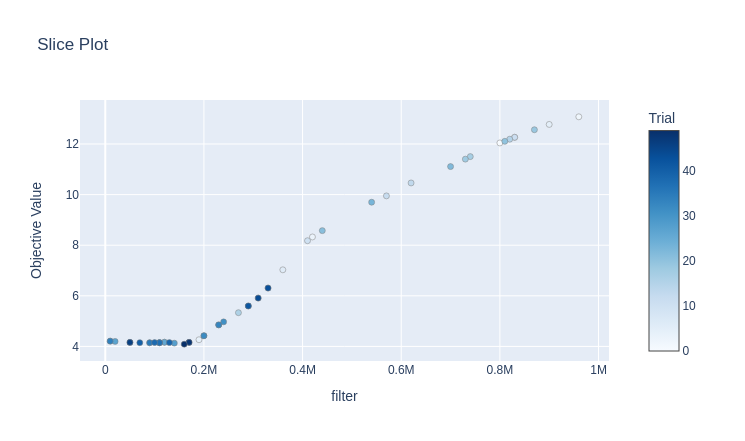

/tmp/ipykernel_1099225/2171199891.py:5: ExperimentalWarning:

JournalStorage is experimental (supported from v3.1.0). The interface can change in the future.




########## trend ##########
number                                       36
value                                  4.205883
datetime_start       2023-03-08 16:54:26.136374
datetime_complete    2023-03-08 16:54:52.650060
duration                 0 days 00:00:26.513686
params_trend                                 20
state                                  COMPLETE
Name: 36, dtype: object
returning original grid
returning original grid


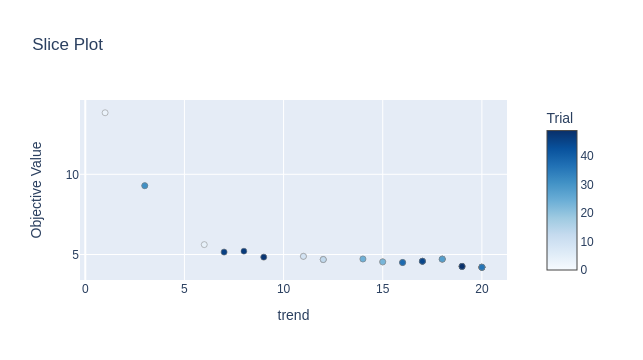


########## constraints ##########
number                                        22
value                                   3.023418
datetime_start        2023-03-08 16:55:06.681250
datetime_complete     2023-03-08 16:55:29.135150
duration                  0 days 00:00:22.453900
params_constraints                          0.01
state                                   COMPLETE
Name: 22, dtype: object


/tmp/ipykernel_1099225/2171199891.py:5: ExperimentalWarning:

JournalStorage is experimental (supported from v3.1.0). The interface can change in the future.



returning original grid
returning original grid


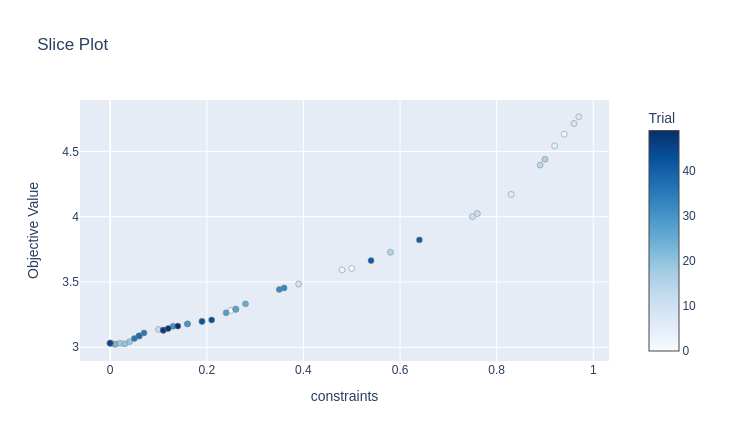


########## eq_sources ##########
number                                       19
value                                  4.318235
datetime_start       2023-03-08 16:56:02.499182
datetime_complete    2023-03-08 16:56:20.994264
duration                 0 days 00:00:18.495082
params_eq_sources                        310000
state                                  COMPLETE
Name: 19, dtype: object


/tmp/ipykernel_1099225/2171199891.py:5: ExperimentalWarning:

JournalStorage is experimental (supported from v3.1.0). The interface can change in the future.



returning original grid
returning original grid


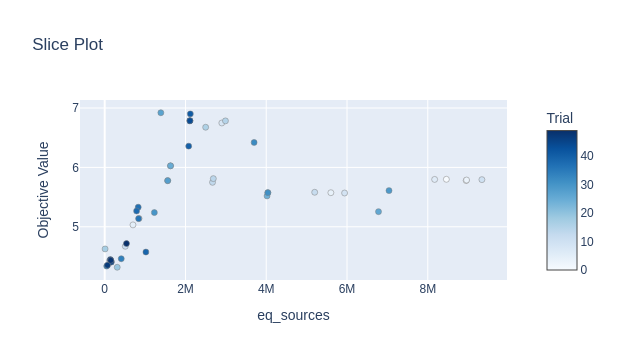

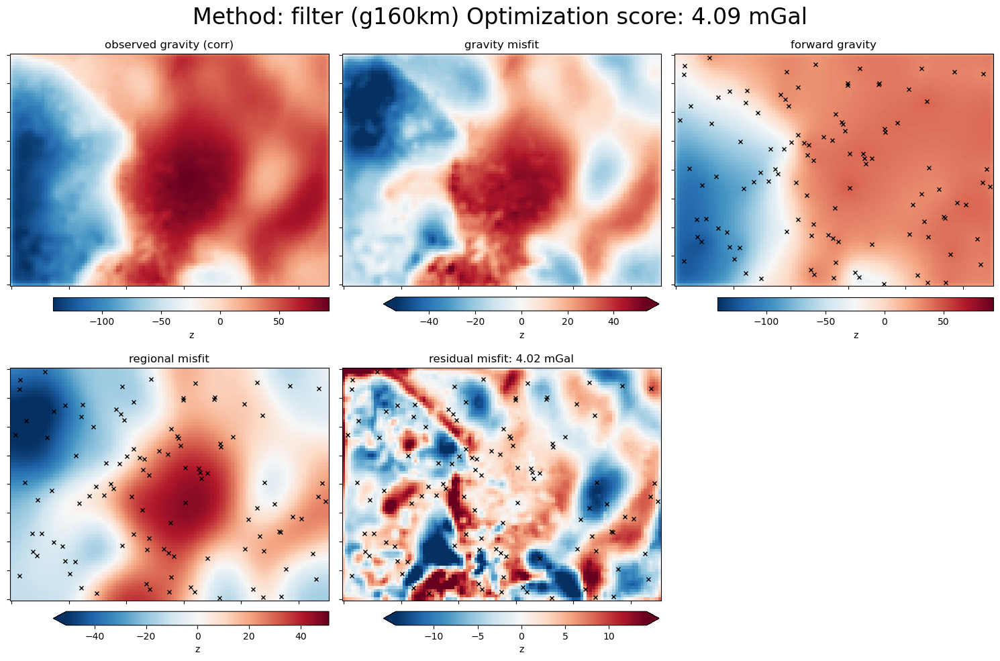

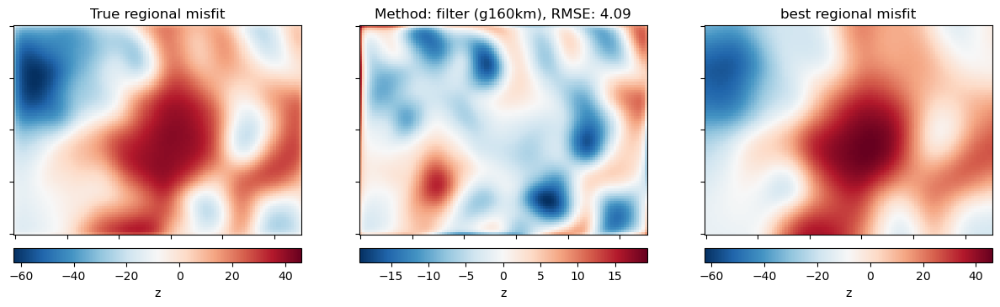

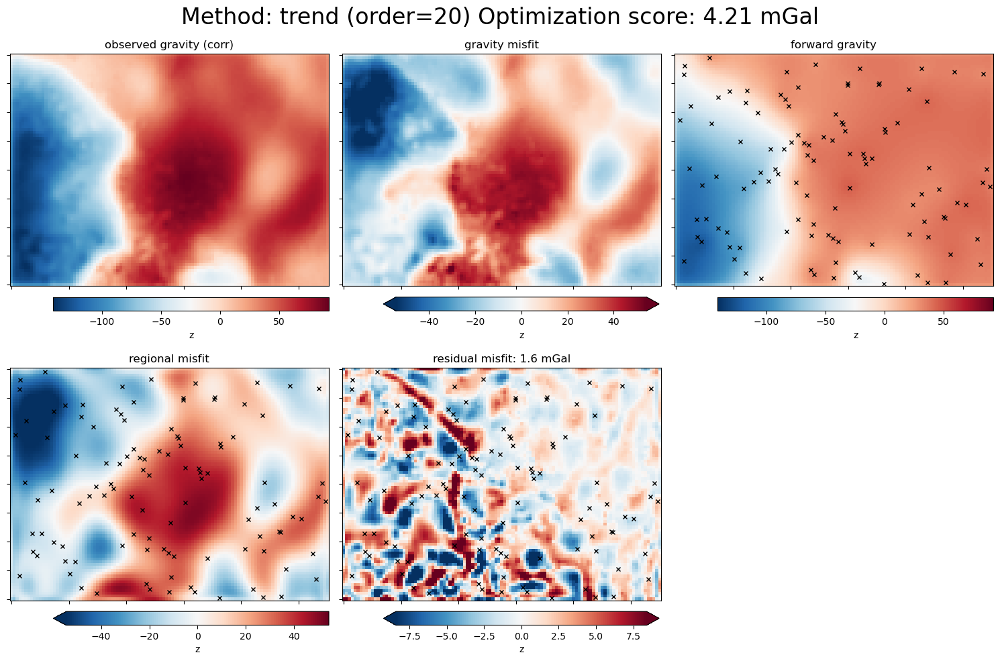

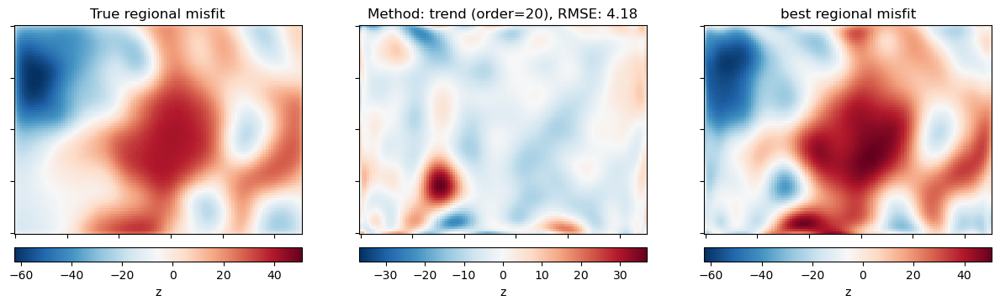

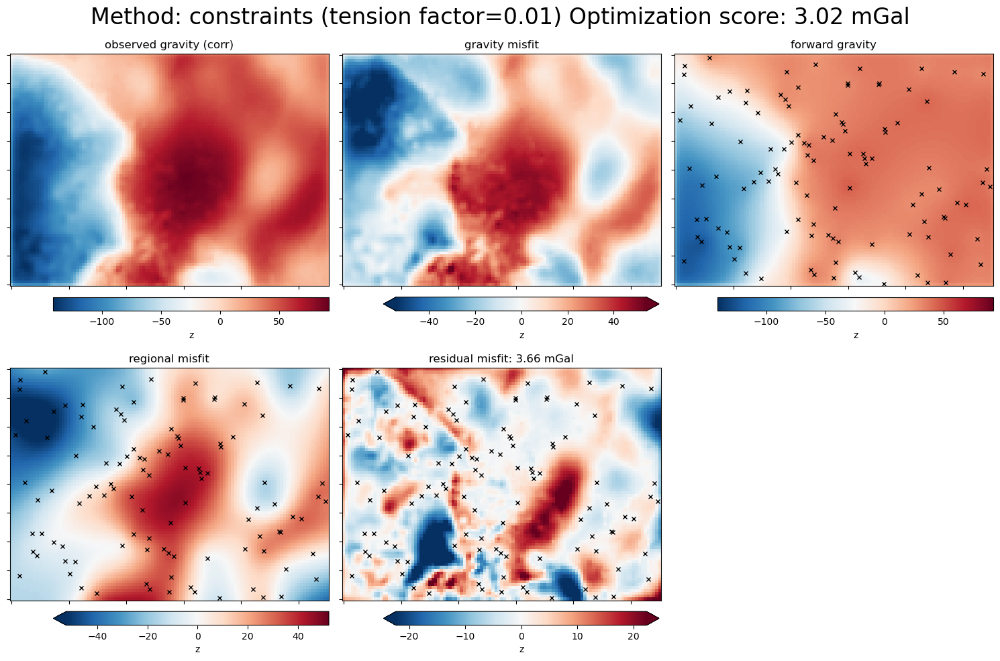

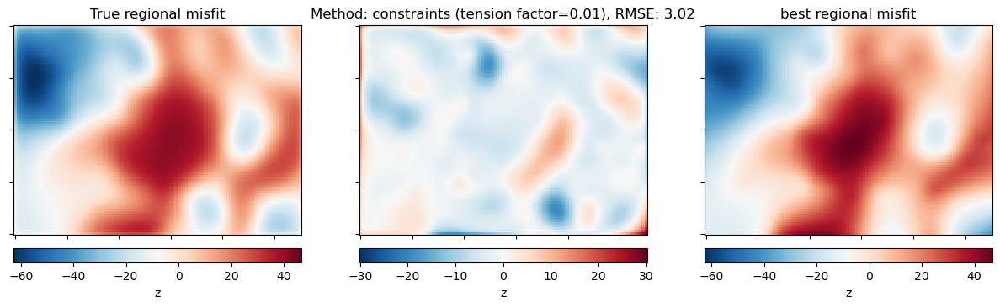

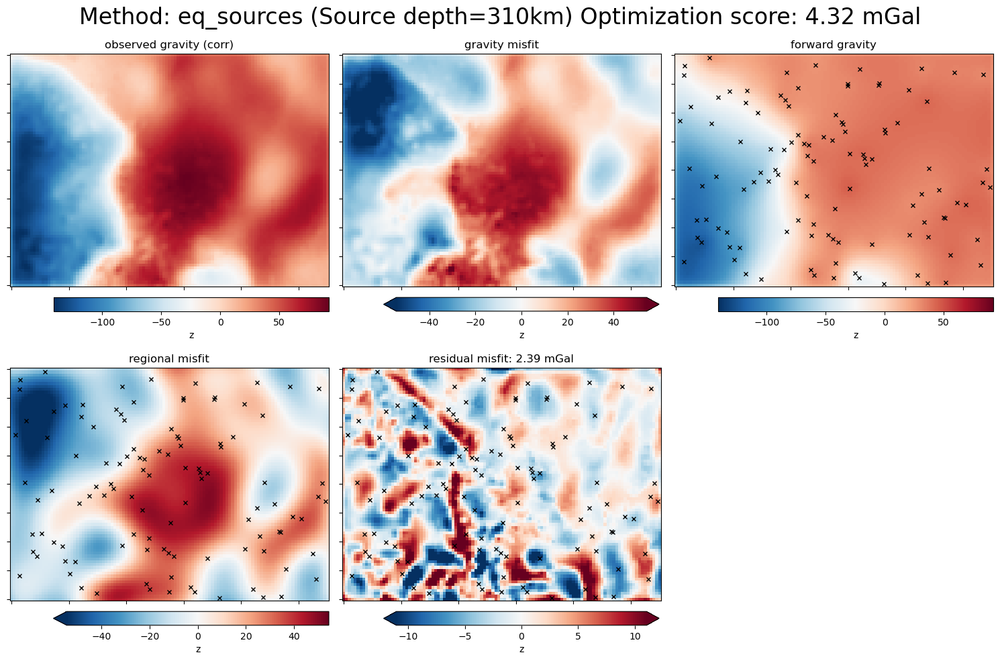

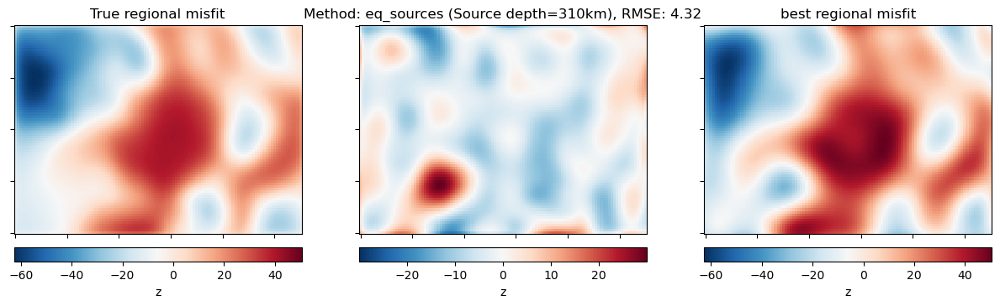

In [12]:
# load studies
study_dfs = []
for i in methods:
    study_name = f"Ross_Sea_regional_seperation_indiv_{i}_{comparison_method}_DC_shift"
    storage = JournalStorage(
        JournalFileStorage(f"../optimization_logs/{study_name}.log")
    )
    study = optuna.load_study(storage=storage, study_name=study_name)
    study_df = study.trials_dataframe()
    study_dfs.append(study_df)

    # plot results
    plotting.plot_best_param(
        study_df, comparison_method, regional_method=i, **regional_kwargs
    )
    optuna.visualization.plot_slice(study).show()

studies = dict(zip(methods, study_dfs))

for k, v in studies.items():
    v["params_method"] = k

regional_sep_combined_studies = pd.concat(
    studies.values(), ignore_index=True
).sort_values(by="value")

In [13]:
df = regional_sep_combined_studies
df.head()

,number,value,datetime_start,datetime_complete,duration,params_filter,state,params_method,params_trend,params_constraints,params_eq_sources
123,23,3.023418,2023-03-08 16:55:06.655933,2023-03-08 16:55:29.757293,0 days 00:00:23.101360,NaN,COMPLETE,constraints,NaN,0.01,NaN
122,22,3.023418,2023-03-08 16:55:06.681250,2023-03-08 16:55:29.135150,0 days 00:00:22.453900,NaN,COMPLETE,constraints,NaN,0.01,NaN
120,20,3.025833,2023-03-08 16:55:06.646720,2023-03-08 16:55:27.679498,0 days 00:00:21.032778,NaN,COMPLETE,constraints,NaN,0.03,NaN
118,18,3.030441,2023-03-08 16:55:06.645722,2023-03-08 16:55:25.789212,0 days 00:00:19.143490,NaN,COMPLETE,constraints,NaN,0.02,NaN
121,21,3.031200,2023-03-08 16:55:06.652311,2023-03-08 16:55:28.768576,0 days 00:00:22.116265,NaN,COMPLETE,constraints,NaN,0.00,NaN


In [14]:
best_filter = df[df.params_method == "filter"].iloc[0].number
best_trend = df[df.params_method == "trend"].iloc[0].number
best_constraints = df[df.params_method == "constraints"].iloc[0].number
best_eq_sources = df[df.params_method == "eq_sources"].iloc[0].number

print(f"best trial w/ method = filter: index {best_filter}")
print(f"best trial w/ method = trend: index {best_trend}")
print(f"best trial w/ method = constraints: index {best_constraints}")
print(f"best trial w/ method = eq. sources: index {best_eq_sources}")

best trial w/ method = filter: index 49
best trial w/ method = trend: index 32
best trial w/ method = constraints: index 23
best trial w/ method = eq. sources: index 19


## Best regional seperation

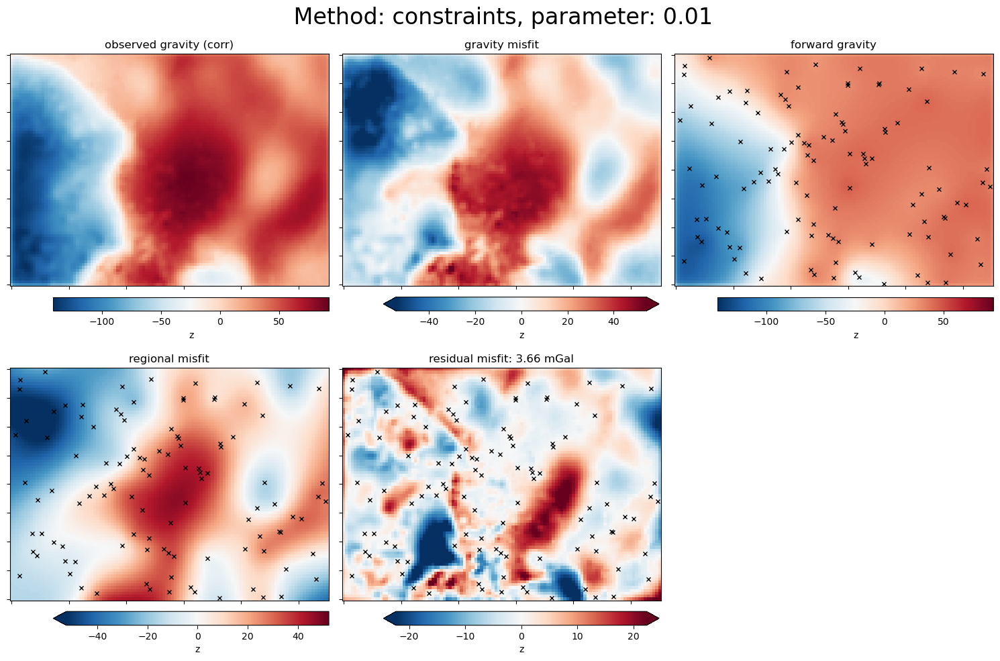

In [17]:
# choose the regional method:
# regional_method = "filter"
# regional_method = "trend"
# regional_method = "constraints"
# regional_method = "eq_sources"
regional_method = df.params_method.iloc[0]

# set the parameter:
# contraints: 1 results in pedastals, 0 is good,
# param = .23

# or use the best parameter from the optimization
param = df[df[f"params_{regional_method}"].notnull()].iloc[0][
    f"params_{regional_method}"
]

df_anomalies = regional.regional_seperation(
    regional_method=regional_method,
    filter=f"g{param}",
    trend=param,
    tension_factor=param,
    eq_sources=param,
    **regional_kwargs,
)

anom_grids = plotting.anomalies_plotting(
    df_anomalies,
    region=inversion_region,
    grav_spacing=layer_spacing,
    title=f" Method: {regional_method}, parameter: {param}",
    constraints=constraint_points,
    input_forward_column="bed_forward",
    input_grav_column="Gobs_corr_shift",
)

In [18]:
df_anomalies.describe()

,northing,easting,basement,bed,Gobs,surface,upward,water_forward,Gobs_corr,bed_forward,Gobs_corr_shift,misfit,reg,res
count,8.991000e+03,8991.000000,8991.000000,8991.000000,8991.000000,8991.000000,8991.0,8991.000000,8991.000000,8991.000000,8991.000000,8991.000000,8991.000000,8991.000000
mean,-1.700000e+06,-25000.000000,0.632587,0.676841,978033.309155,-0.000273,1000.0,-0.000273,978033.309428,0.598581,3.618904,3.020323,2.596617,0.423706
std,1.169110e+05,160217.107984,23.915890,51.674374,66.306051,0.103897,0.0,0.103897,66.233492,49.155304,66.233492,25.812215,23.606824,8.521760
min,-1.900000e+06,-300000.000000,-62.635980,-130.666282,977888.286558,-0.197300,1000.0,-0.197300,977888.480302,-125.439237,-141.210223,-63.686140,-58.939091,-47.142855
25%,-1.800000e+06,-165000.000000,-14.138584,-30.353627,977977.301661,-0.085619,1000.0,-0.085619,977977.389221,-28.669115,-52.301303,-15.264328,-12.101977,-2.984142
50%,-1.700000e+06,-25000.000000,2.891279,30.209080,978058.660440,0.015300,1000.0,0.015300,978058.543638,28.853114,28.853114,4.076606,4.688035,0.205847
75%,-1.600000e+06,115000.000000,18.502351,36.661238,978083.233862,0.080638,1000.0,0.080638,978083.203784,36.466147,53.513260,23.106117,19.254177,4.366177
max,-1.500000e+06,250000.000000,41.275938,48.544026,978121.773582,0.196974,1000.0,0.196974,978121.800708,45.991778,92.110184,60.416388,46.808777,32.921216


# Plot Inputs

In [19]:
# grid the residual misfit
residual = pygmt.surface(
    data=df_anomalies[["easting", "northing", "res"]],
    region=inversion_region,
    spacing=layer_spacing,
    T=0.25,
    # M="0c",
    registration=registration,
)

returning original grid


grd2cpt [ERROR]: Making a continuous cpt from a discrete cpt may give unexpected results!


returning original grid


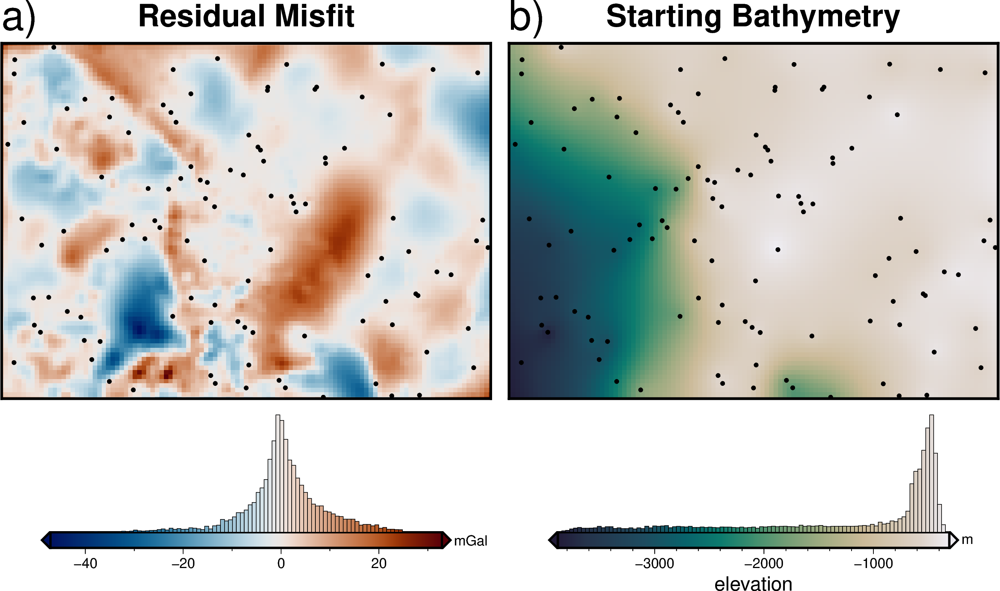

In [37]:
# plot residual misfit
fig = maps.plot_grd(
    grid=residual,
    fig_height=8,
    cmap="vik+h0",
    region=buffer_region,
    title="Residual Misfit",
    cbar_unit="mGal",
    show_region=inversion_region,
    points=constraint_points.rename(columns={"easting": "x", "northing": "y"}),
    points_style="c0.1c",
    hist=True,
    cbar_yoffset=3,
)
fig.text(
    position="TL",
    justify="BL",
    text="a)",
    font="26p,Helvetica,black",
    offset="j0/.3",
    no_clip=True,
)

# plot layer 2
fig = maps.plot_grd(
    grid=lowres_bed,
    fig_height=8,
    cmap="rain",
    reverse_cpt=True,
    region=buffer_region,
    grd2cpt=True,
    title="Starting Bathymetry",
    cbar_label="elevation",
    cbar_unit="m",
    show_region=inversion_region,
    points=constraint_points.rename(columns={"easting": "x", "northing": "y"}),
    points_style="c0.1c",
    hist=True,
    cbar_yoffset=3,
    fig=fig,
    origin_shift="xshift",
)
fig.text(
    position="TL",
    justify="BL",
    text="b)",
    font="26p,Helvetica,black",
    offset="j0/.3",
    no_clip=True,
)

fig.show()

# Constraints grid

In [21]:
layer_spacing

5000.0

In [24]:
starting_prisms = copy.deepcopy(bed_prisms)

weights, min_dist = inv_utils.constraints_grid(
    constraint_points,
    starting_prisms,
    inner_bound=5e3,
    outer_bound=20e3,
    low=0,
    high=1,
    interp_type="spline",
    # tension_factor = .9,
    # plot = True,
)
starting_prisms["weights"] = weights.z
starting_prisms["min_dist"] = min_dist.min_dist
starting_prisms

<xarray.Dataset>
Dimensions:    (northing: 81, easting: 111)
Coordinates:
  * easting    (easting) float64 -3e+05 -2.95e+05 -2.9e+05 ... 2.45e+05 2.5e+05
  * northing   (northing) float64 -1.9e+06 -1.895e+06 ... -1.505e+06 -1.5e+06
    top        (northing, easting) float32 -1.208e+03 -1.208e+03 ... -420.3
    bottom     (northing, easting) float64 -3.885e+03 -3.854e+03 ... -1.208e+03
Data variables:
    density    (northing, easting) int64 -1270 -1270 -1270 ... 1270 1270 1270
    thickness  (northing, easting) float32 -2.677e+03 -2.646e+03 ... 769.5 787.8
    weights    (northing, easting) float32 1.0 1.0 1.0 1.0 ... 1.0 1.0 1.0 1.0
    min_dist   (northing, easting) float64 4.32e+04 4.185e+04 ... 3.649e+04
Attributes:
    coords_units:      meters
    properties_units:  SI

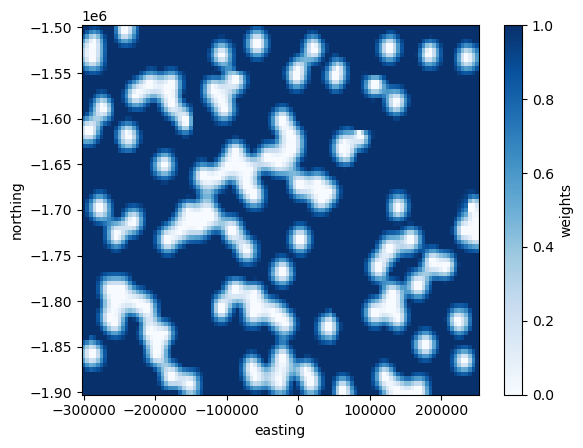

In [25]:
starting_prisms.weights.plot(cmap="Blues")

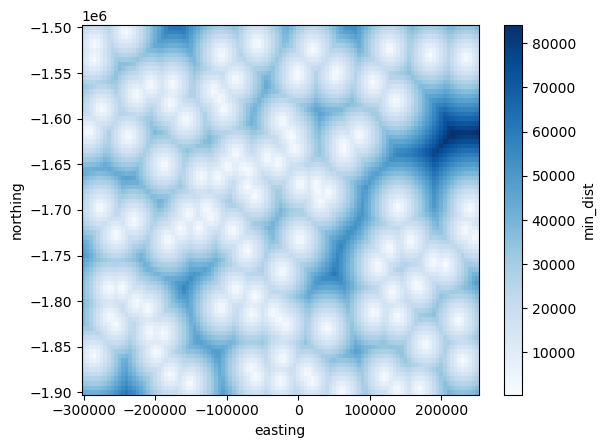

In [26]:
starting_prisms.min_dist.plot(cmap="Blues")

### Save to Zarr

In [27]:
enc = {x: {"compressor": zarr.Blosc()} for x in starting_prisms}
starting_prisms.to_zarr(
    "../synthetic_data/Ross_Sea_starting_prisms.zarr",
    encoding=enc,
    mode="w",
)

In [28]:
starting_prisms = xr.open_zarr("../synthetic_data/Ross_Sea_starting_prisms.zarr")

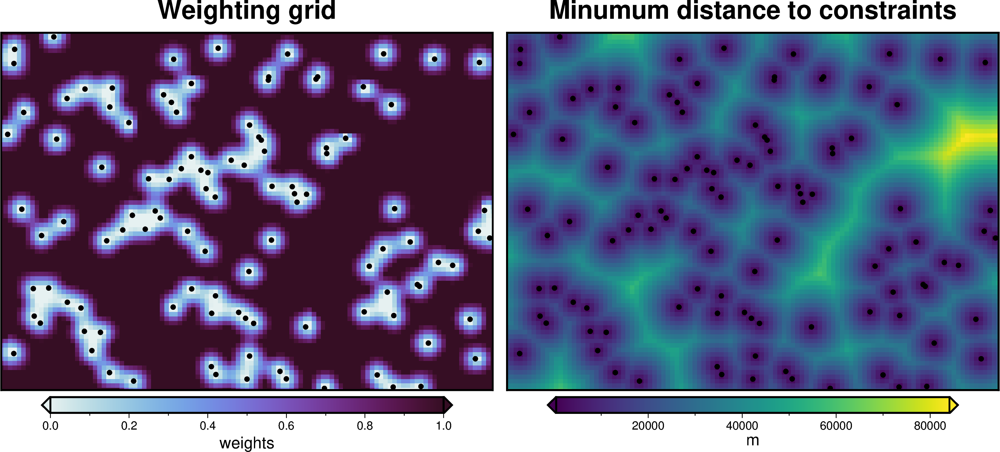

In [29]:
fig = maps.plot_grd(
    starting_prisms.weights,
    fig_height=10,
    title="Weighting grid",
    cbar_label="weights",
    cmap="dense",
    points=constraint_points.rename(columns={"easting": "x", "northing": "y"}),
    points_style="c0.15c",
)
fig = maps.plot_grd(
    starting_prisms.min_dist,
    fig=fig,
    origin_shift="xshift",
    title="Minumum distance to constraints",
    cbar_label="m",
    cmap="viridis",
    points=constraint_points.rename(columns={"easting": "x", "northing": "y"}),
    points_style="c0.15c",
)

fig.show()

# Inversion

Now that we have $G_{misfit}$, we can run an inversion to attempt to recover the true Layer 2 topography. 

To determine optimal inversion parameters, we will run an optimization routine which minimizes the root median square error (RMSE) of the ending Surface 2 to the true Surface 2. 

The parameters we will test are:
* Jacobian methods (annulus vs small prisms)
* Solver methods (Scipy lsqr vs Verde lsqr)
* Solver damping
* max prism change per iteration

## Testing weighting the Jacobian 
by distance to nearest constraints

### without weights


##############################################################################################
iteration 1
Layer correction median: 17 m, RMSE:72 m

updated misfit RMSE: 0.46
updated L2-norm: 0.68,  tolerance: 0.1
updated delta L2-norm : 2.81,  tolerance: 0.8

##############################################################################################
iteration 2
Layer correction median: 3 m, RMSE:9 m

updated misfit RMSE: 0.06
updated L2-norm: 0.25,  tolerance: 0.1
updated delta L2-norm : 2.77,  tolerance: 0.8

##############################################################################################
iteration 3
Layer correction median: 0 m, RMSE:1 m

updated misfit RMSE: 0.01
updated L2-norm: 0.09,  tolerance: 0.1
updated delta L2-norm : 2.63,  tolerance: 0.8

Inversion terminated after 3 iterations with L2-norm = 0.09 because L2-norm < 0.1
returning original grid
returning original grid
returning original grid
returning original grid
returning original grid


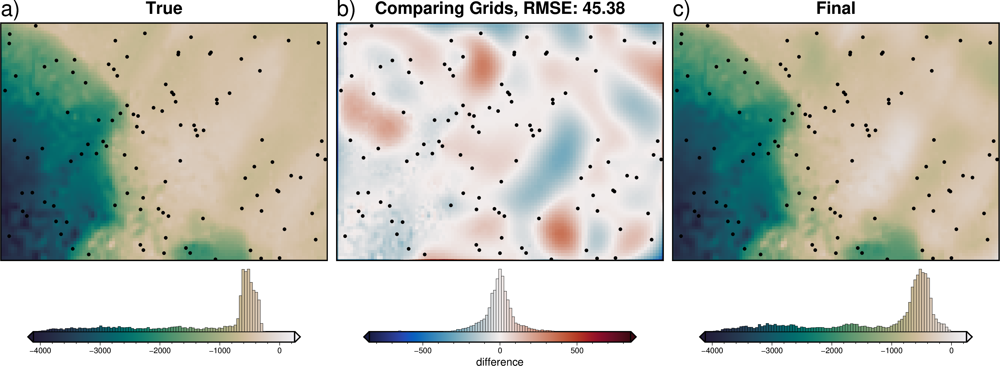

RMSE: 45.38177208962179
constraints RMSE: 18.47


In [30]:
# set kwargs for inversion
inversion_kwargs = dict(
    input_grav=df_anomalies,
    input_grav_column="Gobs_corr_shift",
    prism_layer=starting_prisms,
    max_iterations=10,
    l2_norm_tolerance=0.1,
    delta_l2_norm_tolerance=0.8,
    apply_weights=False,
)
no_weights_results = inv.inversion_RMSE(
    bed,
    plot=True,
    constraints=constraint_points.rename(columns={"easting": "x", "northing": "y"}),
    deriv_type="annulus",
    # deriv_type = "prisms",
    # solver_type = "verde least squares",
    solver_type="scipy least squares",
    solver_damping=0.01,
    **inversion_kwargs,
)

(
    no_weights_rmse,
    no_weights_prism_results,
    no_weights_grav_results,
    no_weights_params,
    no_weights_elapsed_time,
    no_weights_constraints_rmse,
) = no_weights_results

print(f"RMSE: {no_weights_rmse}")
print(f"constraints RMSE: {no_weights_constraints_rmse}")

returning original grid
returning original grid
returning original grid
returning original grid


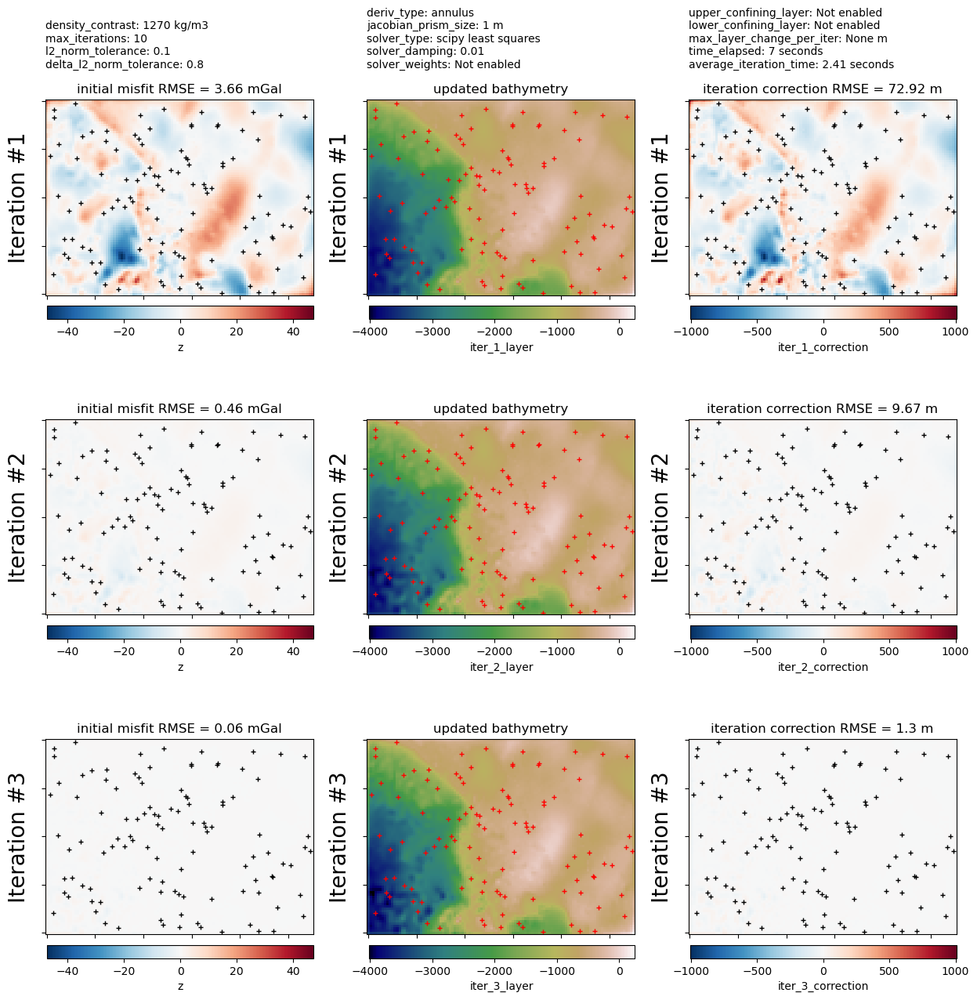

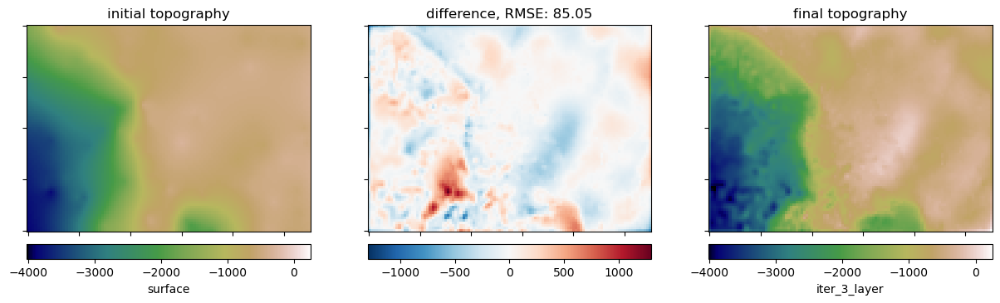

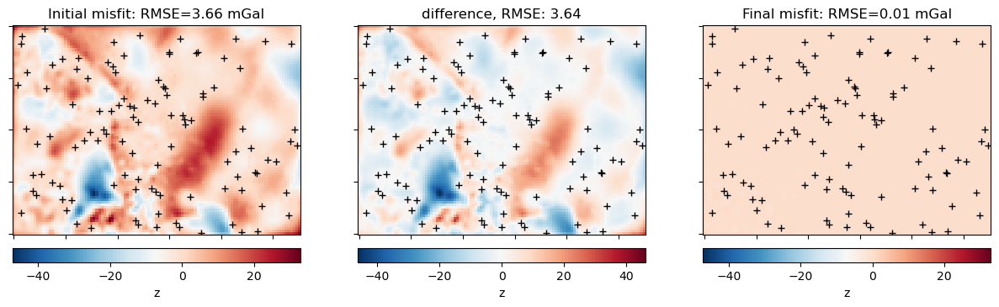

In [31]:
no_weights_grids = plotting.plot_inversion_results(
    no_weights_grav_results,
    no_weights_prism_results,
    no_weights_params,
    grav_region=inversion_region,
    grav_spacing=layer_spacing,
    constraints=constraint_points,
    # plot_iter_results=False
    # plot_topo_results=False,
    # plot_grav_results=False,
    iters_to_plot=4,
)

In [32]:
no_weights_ds = no_weights_prism_results.set_index(["northing", "easting"]).to_xarray()
print(f"max iter: {list(no_weights_ds.variables)[-1][5:-6]}")
no_weights_final_topo = no_weights_ds[list(no_weights_ds.variables)[-1]]

max iter: 3


### with weights


##############################################################################################
iteration 1
Layer correction median: 17 m, RMSE:85 m

updated misfit RMSE: 0.57
updated L2-norm: 0.75,  tolerance: 0.1
updated delta L2-norm : 2.54,  tolerance: 0.8

##############################################################################################
iteration 2
Layer correction median: 0 m, RMSE:13 m

updated misfit RMSE: 0.16
updated L2-norm: 0.4,  tolerance: 0.1
updated delta L2-norm : 1.89,  tolerance: 0.8

##############################################################################################
iteration 3
Layer correction median: 0 m, RMSE:2 m

updated misfit RMSE: 0.04
updated L2-norm: 0.21,  tolerance: 0.1
updated delta L2-norm : 1.92,  tolerance: 0.8

##############################################################################################
iteration 4
Layer correction median: 0 m, RMSE:0 m

updated misfit RMSE: 0.03
updated L2-norm: 0.16,  tolerance: 0.1
updated 

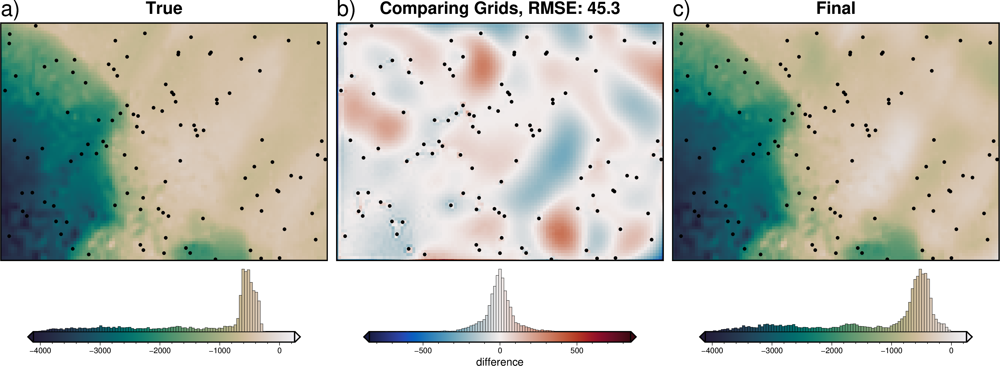

RMSE: 45.296710486606116
constraints RMSE: 8.11


In [33]:
# set kwargs for inversion
inversion_kwargs = dict(
    input_grav=df_anomalies,
    input_grav_column="Gobs_corr_shift",
    prism_layer=starting_prisms,
    max_iterations=10,
    l2_norm_tolerance=0.1,
    delta_l2_norm_tolerance=0.8,
    apply_weights=True,
)

weights_results = inv.inversion_RMSE(
    bed,
    plot=True,
    constraints=constraint_points.rename(columns={"easting": "x", "northing": "y"}),
    deriv_type="annulus",
    # deriv_type = "prisms",
    # solver_type = "verde least squares",
    solver_type="scipy least squares",
    solver_damping=0.01,
    **inversion_kwargs,
)

(
    weights_rmse,
    weights_prism_results,
    weights_grav_results,
    weights_params,
    weights_elapsed_time,
    weights_constraints_rmse,
) = weights_results

print(f"RMSE: {weights_rmse}")
print(f"constraints RMSE: {weights_constraints_rmse}")

In [34]:
weights_ds = weights_prism_results.set_index(["northing", "easting"]).to_xarray()
print(f"max iter: {list(weights_ds.variables)[-1][5:-6]}")
weights_final_topo = weights_ds[list(weights_ds.variables)[-1]]

max iter: 7


returning original grid
returning original grid
returning original grid
returning original grid


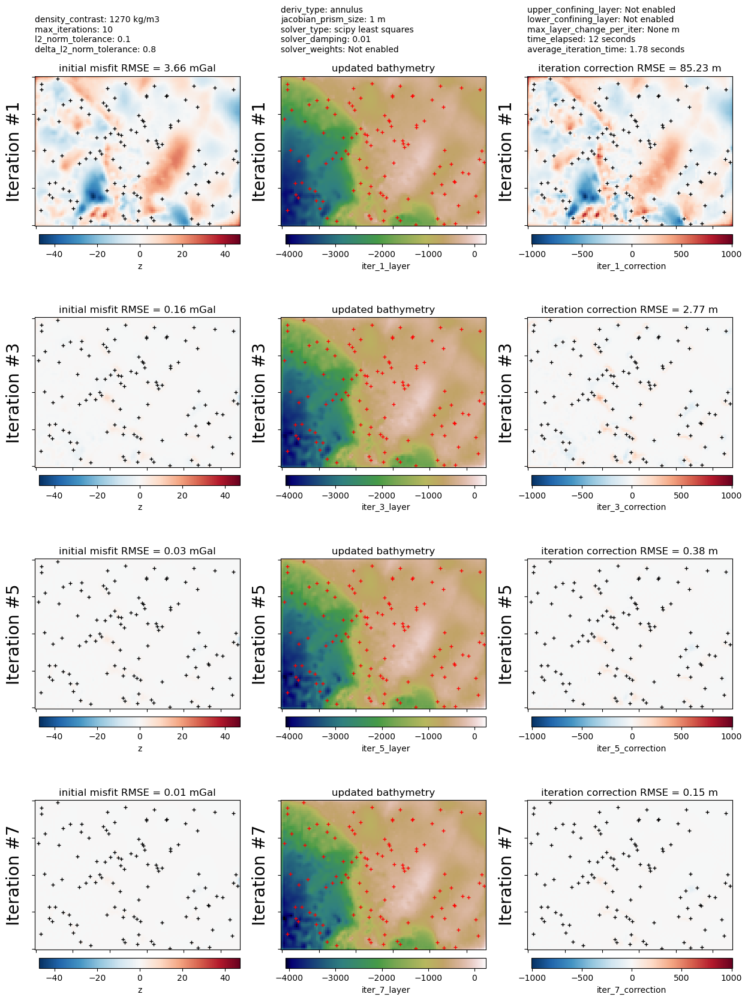

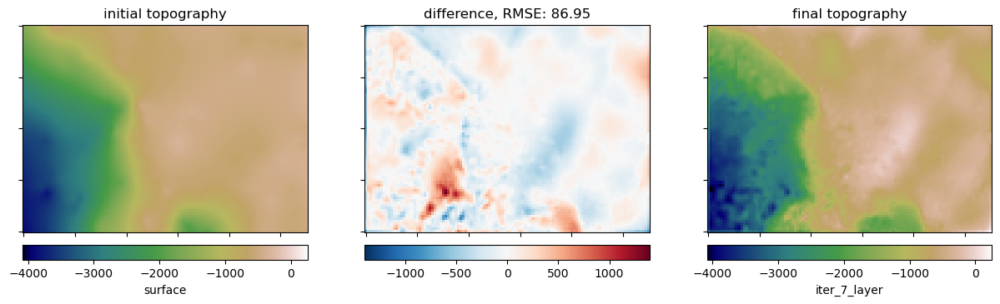

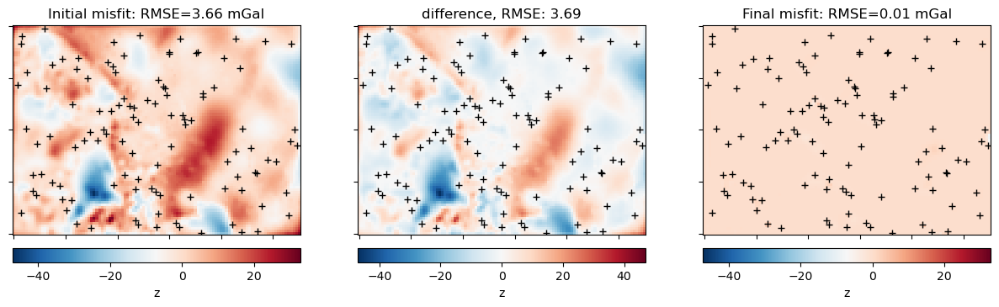

In [35]:
weights_grids = plotting.plot_inversion_results(
    weights_grav_results,
    weights_prism_results,
    weights_params,
    grav_region=inversion_region,
    grav_spacing=layer_spacing,
    constraints=constraint_points,
    # plot_iter_results=False
    # plot_topo_results=False,
    # plot_grav_results=False,
    iters_to_plot=4,
)

returning original grid
returning original grid


grd2cpt [ERROR]: Making a continuous cpt from a discrete cpt may give unexpected results!


returning original grid


grd2cpt [ERROR]: Making a continuous cpt from a discrete cpt may give unexpected results!


returning original grid


grd2cpt [ERROR]: Making a continuous cpt from a discrete cpt may give unexpected results!


returning original grid


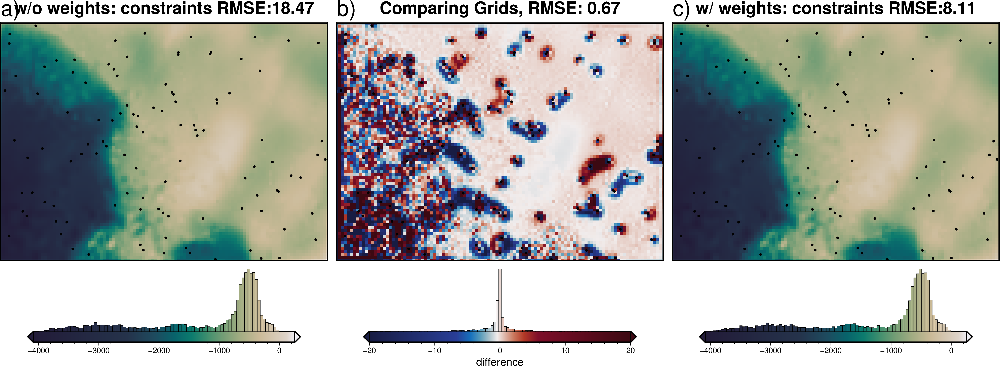

In [40]:
_ = utils.grd_compare(
    no_weights_final_topo,
    weights_final_topo,
    grid1_name=f"w/o weights: constraints RMSE:{no_weights_constraints_rmse}",
    grid2_name=f"w/ weights: constraints RMSE:{weights_constraints_rmse}",
    plot=True,
    points=constraint_points.rename(columns={"easting": "x", "northing": "y"}),
    diff_lims=[-20, 20],
    # plot_type="xarray",
    # cmap="gist_earth",
    # robust=True,
    plot_type="pygmt",
    cmap="rain",
    reverse_cpt=True,
    hist=True,
    inset=False,
    points_style="c.1c",
    subplot_labels=True,
    grd2cpt=True,
)

## Adding contraints to the solvers
Instead of adding constraints to the Jacobian, we should be able to use other types of solvers with accept constraints. Here are a few options:

Currently using two solvers, without constraints
* scipy.sparse.linalg.lsqr
* scikit-learn.linear_model.Ridge

* scipy
    * optimize
        * Trust-Region constrainted algorithm
        * Sequential least squares programming algorithm

        * [scipy.optimize.lsq_linear](https://docs.scipy.org/doc/scipy/reference/generated/scipy.optimize.lsq_linear.html#scipy.optimize.lsq_linear)
            * allows bounds for the output (i.e. surface correction at a certain point must be between x and y)
        * [scipy.optimize.minimize](https://docs.scipy.org/doc/scipy/reference/generated/scipy.optimize.minimize.html#scipy.optimize.minimize)
            * [scipy.optimize.fmin_slsqp](https://docs.scipy.org/doc/scipy/reference/generated/scipy.optimize.fmin_slsqp.html#scipy.optimize.fmin_slsqp)     
* [constrained-linear-regression](https://github.com/avidale/constrained-linear-regression)
    * allows bounds to be added to the solution
    * need to test to see if bounds can be per prism
* [LMFIT-py](https://github.com/lmfit/lmfit-py/)
    * wraps scipy algorithms with bounds and constraints
    * use min and max for parameter bounds
    * or inequality constraints
    * or mathmatical constriants based on other params
    * 


* [c-lasso](https://github.com/Leo-Simpson/c-lasso#regression-and-classification-problems)
    * not sure how to actually implement this
* scikit-learn
    * [Bayesian Ridge Regression](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.BayesianRidge.html#sklearn.linear_model.BayesianRidge)
        * not sure if this actually accepts constraints
    * linear_model.Lasso
        * has alpha parameter for damping
        * not sure how this actually uses constraints
        
LOOK AT SAMPLE WEIGHTS IN THE FIT() OF SCIKITLEARN
https://scikit-learn.org/dev/glossary.html#glossary-sample-props

https://people.duke.edu/~ccc14/sta-663-2018/notebooks/S09H_Constrained_Optimization.html

* pyGIMLi
* Fatiando legacy
* simPEG


* statsmodels
* cvxopt
* GEKKO

In [127]:
# set kwargs for inversion
inversion_kwargs = dict(
    input_grav=df_anomalies,
    input_grav_column="Gobs_corr",
    prism_layer=starting_prisms,
    max_iterations=1,
    l2_norm_tolerance=0.1,
    delta_l2_norm_tolerance=0.8,
    apply_weights=False,
)

In [139]:
result_unconstrained = inv.solver(
    jacobian=A,
    residuals=b,
    solver_type="scipy least squares",
)
print(type(result_unconstrained))
print(np.shape(result_unconstrained))
result_unconstrained

<class 'numpy.ndarray'>
(8991,)


array([-217.99294769, -417.16017753, -220.64746718, ...,   53.58067509,
        -32.3365214 ,  -56.26444831])

<AxesSubplot: >

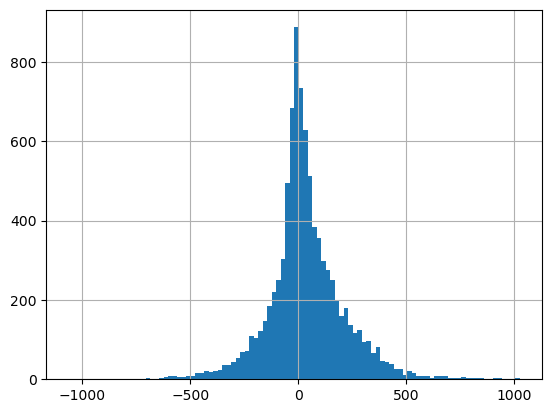

In [152]:
pd.Series(result_unconstrained).hist(bins=100)

In [143]:
result_constrained = inv.solver(
    jacobian=A,
    residuals=b,
    solver_type="scipy constrained",
)
constrained_x = result_constrained["x"]
print(type(constrained_x))
print(np.shape(constrained_x))
constrained_x

<class 'numpy.ndarray'>
(8991,)


array([-217.99299394, -417.16929827, -220.63468904, ...,   53.58078142,
        -32.33641182,  -56.26435742])

<AxesSubplot: >

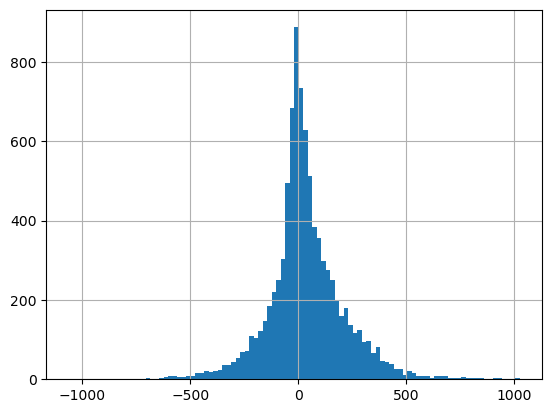

In [153]:
pd.Series(constrained_x).hist(bins=100)

In [168]:
surface_grid = xr.where(
    starting_prisms.density > 0, starting_prisms.top, starting_prisms.bottom
)
starting_prisms["surface"] = surface_grid

prisms_df = starting_prisms.to_dataframe().reset_index().dropna().astype(float)
prisms_df = inv_utils.sample_bounding_surfaces(
    prisms_df,
    upper_confining_layer=surface,
    lower_confining_layer=None,
)
# where prisms are within 5km of constraint, set upper bounds to starting bed
prisms_df["upper_bounds"] = np.where(
    prisms_df.min_dist < 5e3, prisms_df.surface, prisms_df.upper_bounds
)
prisms_df

,northing,easting,density,thickness,top,bottom,weights,min_dist,surface
0,-1900000.0,-300000.0,-1270.0,-2677.145020,-1208.066528,-3885.211426,1.0,43204.548261,-3885.211426
1,-1900000.0,-295000.0,-1270.0,-2645.624512,-1208.066528,-3853.691162,1.0,41846.180354,-3853.691162
2,-1900000.0,-290000.0,-1270.0,-2612.937012,-1208.066528,-3821.003418,1.0,41055.725911,-3821.003418
3,-1900000.0,-285000.0,-1270.0,-2578.917969,-1208.066528,-3786.984619,1.0,40866.152864,-3786.984619
4,-1900000.0,-280000.0,-1270.0,-2543.386230,-1208.066528,-3751.452881,1.0,41285.739302,-3751.452881
...,...,...,...,...,...,...,...,...,...
8986,-1500000.0,230000.0,1270.0,729.925659,-478.140869,-1208.066528,1.0,33702.402122,-478.140869
8987,-1500000.0,235000.0,1270.0,740.417236,-467.649292,-1208.066528,1.0,33314.307954,-467.649292
8988,-1500000.0,240000.0,1270.0,753.627930,-454.438599,-1208.066528,1.0,33672.456402,-454.438599
8989,-1500000.0,245000.0,1270.0,769.513550,-438.552979,-1208.066528,1.0,34753.784339,-438.552979


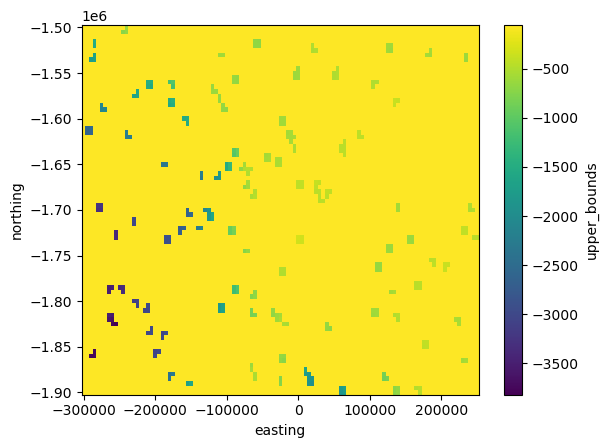

In [173]:
ds = prisms_df.set_index(["northing", "easting"]).to_xarray()
ds.upper_bounds.plot()

In [181]:
result_bounds = sp.optimize.lsq_linear(
    A=A,
    b=b,
    bounds=(-np.inf, np.array(prisms_df.upper_bounds)),
    method="trf",
    max_iter=2,
)
constrained_x = result_bounds["x"]
print(type(constrained_x))
print(np.shape(constrained_x))
constrained_x

<class 'numpy.ndarray'>
(8991,)


array([-216.57310894, -413.08409098, -218.42478956, ..., -154.29652237,
        -80.24076708,  -62.43059793])

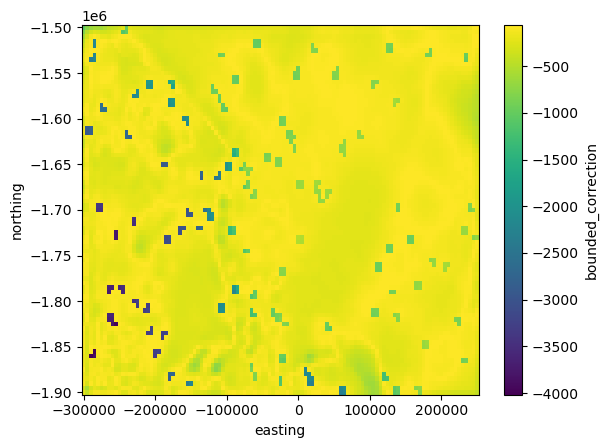

In [205]:
df = pd.concat([prisms_df, pd.DataFrame({"bounded_correction": constrained_x})], axis=1)
ds = df.set_index(["northing", "easting"]).to_xarray()
ds.bounded_correction.plot()

### with constrained-linear-regression

In [188]:
from constrained_linear_regression import ConstrainedLinearRegression
from sklearn.linear_model import LinearRegression

In [189]:
model = ConstrainedLinearRegression(
    max_iter=1,
)
model.fit(
    X=A,
    y=b,
)
model

THE MODEL DID NOT CONVERGE


ConstrainedLinearRegression(max_iter=1)

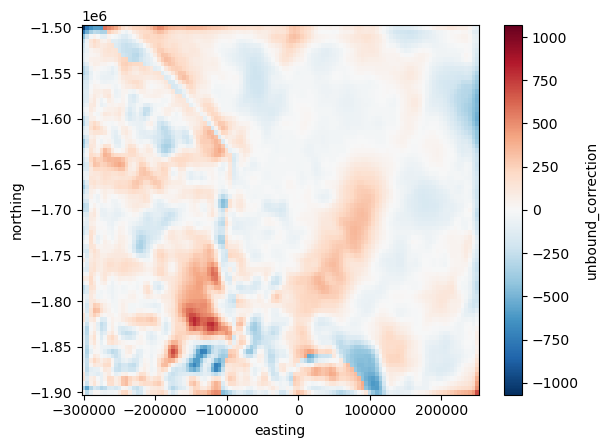

In [211]:
df = pd.concat([prisms_df, pd.DataFrame({"unbound_correction": model.coef_})], axis=1)
ds = df.set_index(["northing", "easting"]).to_xarray()
ds.unbound_correction.plot()

In [212]:
surface_grid = xr.where(
    starting_prisms.density > 0, starting_prisms.top, starting_prisms.bottom
)
starting_prisms["surface"] = surface_grid

prisms_df = starting_prisms.to_dataframe().reset_index().dropna().astype(float)
prisms_df = inv_utils.sample_bounding_surfaces(
    prisms_df,
    upper_confining_layer=surface,
    lower_confining_layer=None,
)
# where prisms are within 5km of constraint, set upper bounds to starting bed
prisms_df["upper_bounds"] = np.where(
    prisms_df.min_dist < 5e3, prisms_df.surface, prisms_df.upper_bounds
)
prisms_df["lower_bounds"] = np.where(
    prisms_df.min_dist < 5e3, prisms_df.surface, -np.inf
)
prisms_df

,northing,easting,density,thickness,top,bottom,weights,min_dist,surface,upper_bounds,lower_bounds
0,-1900000.0,-300000.0,-1270.0,-2677.145020,-1208.066528,-3885.211426,1.0,43204.548261,-3885.211426,-65.113564,-inf
1,-1900000.0,-295000.0,-1270.0,-2645.624512,-1208.066528,-3853.691162,1.0,41846.180354,-3853.691162,-65.168144,-inf
2,-1900000.0,-290000.0,-1270.0,-2612.937012,-1208.066528,-3821.003418,1.0,41055.725911,-3821.003418,-65.212982,-inf
3,-1900000.0,-285000.0,-1270.0,-2578.917969,-1208.066528,-3786.984619,1.0,40866.152864,-3786.984619,-65.263718,-inf
4,-1900000.0,-280000.0,-1270.0,-2543.386230,-1208.066528,-3751.452881,1.0,41285.739302,-3751.452881,-65.304039,-inf
...,...,...,...,...,...,...,...,...,...,...,...
8986,-1500000.0,230000.0,1270.0,729.925659,-478.140869,-1208.066528,1.0,33702.402122,-478.140869,-56.769569,-inf
8987,-1500000.0,235000.0,1270.0,740.417236,-467.649292,-1208.066528,1.0,33314.307954,-467.649292,-56.813171,-inf
8988,-1500000.0,240000.0,1270.0,753.627930,-454.438599,-1208.066528,1.0,33672.456402,-454.438599,-56.830158,-inf
8989,-1500000.0,245000.0,1270.0,769.513550,-438.552979,-1208.066528,1.0,34753.784339,-438.552979,-56.834515,-inf


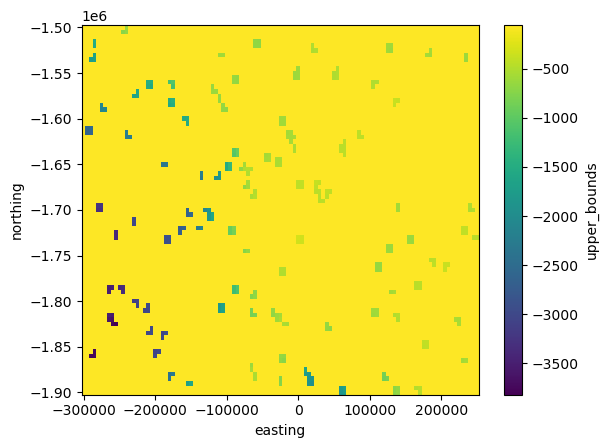

In [213]:
ds = prisms_df.set_index(["northing", "easting"]).to_xarray()
ds.upper_bounds.plot()

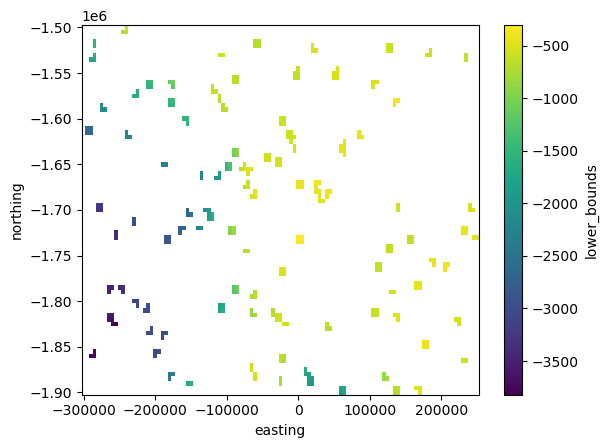

In [214]:
ds.lower_bounds.plot()

In [215]:
# set bounds
min_coef = np.array(prisms_df.lower_bounds)
max_coef = np.array(prisms_df.upper_bounds)

In [219]:
model = ConstrainedLinearRegression(
    max_iter=1,
    ridge=1000,
    fit_intercept=False,
)

model.fit(
    X=A,
    y=b,
    max_coef=max_coef,
    min_coef=min_coef,
)
model

ConstrainedLinearRegression(max_iter=1, ridge=1000)

In [221]:
model.max_iter

1

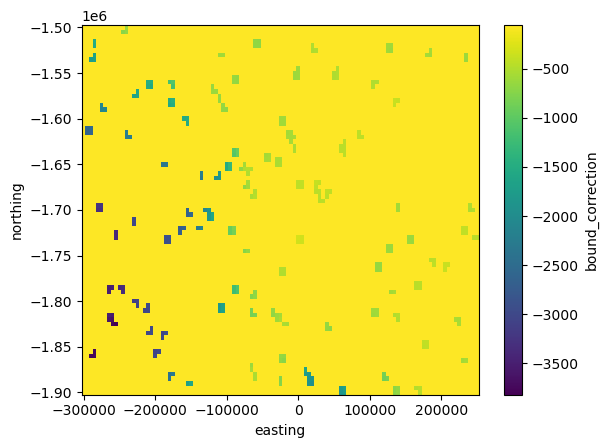

In [220]:
df = pd.concat([prisms_df, pd.DataFrame({"bound_correction": model.coef_})], axis=1)
ds = df.set_index(["northing", "easting"]).to_xarray()
ds.bound_correction.plot()

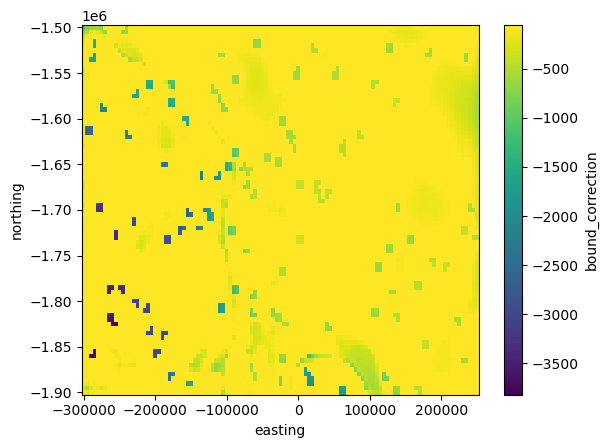

In [218]:
df = pd.concat([prisms_df, pd.DataFrame({"bound_correction": model.coef_})], axis=1)
ds = df.set_index(["northing", "easting"]).to_xarray()
ds.bound_correction.plot()

In [137]:
# prism_results, grav_results, params, elapsed_time = inv.geo_inversion(
#     deriv_type = "annulus",
#     # deriv_type = "prisms",

#     # solver_type = "verde least squares",
#     # solver_type = "scipy least squares",
#     solver_type = "scipy constrained",

#     # solver_damping = .01,
#      **inversion_kwargs,
#         )

In [ ]:
ds = prism_results.set_index(["northing", "easting"]).to_xarray()
ds.iter_1_correction.plot(robust=True)

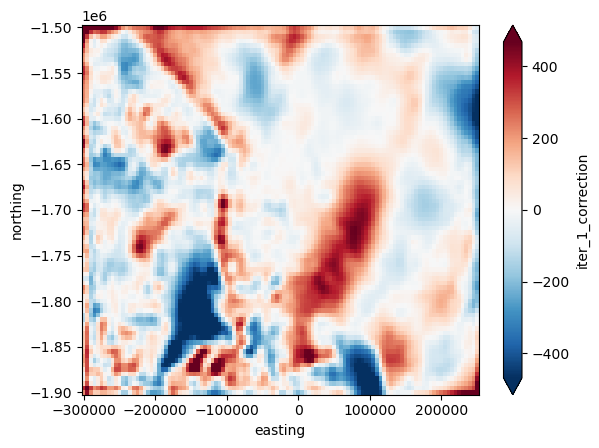

In [126]:
ds = prism_results.set_index(["northing", "easting"]).to_xarray()
ds.iter_1_correction.plot(robust=True)

In [120]:
# results = inv.inversion_RMSE(
#     bed,
#     plot=True,
#     constraints = constraint_points.rename(columns = {"easting":"x","northing":"y"}),
#     deriv_type = "annulus",
#     # deriv_type = "prisms",

#     # solver_type = "verde least squares",
#     solver_type = "scipy least squares",

#     solver_damping = .01,
#      **inversion_kwargs,
#         )

# (rmse,
# prism_results,
# grav_results,
# params,
# elapsed_time,
# constraints_rmse) = results

# print(f"RMSE: {rmse}")
# print(f"constraints RMSE: {constraints_rmse}")

In [ ]:
grids = plotting.plot_inversion_results(
    grav_results,
    prism_results,
    params,
    grav_region=inversion_region,
    grav_spacing=layer_spacing,
    constraints=constraint_points,
    # plot_iter_results=False
    # plot_topo_results=False,
    # plot_grav_results=False,
    iters_to_plot=4,
)

## Optimization

In [19]:
# set name and storage for the optimization
study_name = "Ross_Sea_inversion_with_regional_params"
storage = JournalStorage(JournalFileStorage(f"../optimization_logs/{study_name}.log"))

# set number of runs
n_trials = 200

# set objectives
objectives = [
    "RMSE"
    # "duration"
    # "constraints"
]

# set directions
directions = [
    "minimize"
    # "minimize"
    # "minimize"
]

# create study
study = optuna.create_study(
    study_name=study_name,
    storage=storage,
    directions=directions,
    # sampler=optuna.samplers.TPESampler(n_startup_trials=int(n_trials/3)),
    # sampler=optuna.integration.BoTorchSampler(n_startup_trials=int(n_trials/3)),
    sampler=optuna.samplers.RandomSampler(),
    load_if_exists=True,
)

# define the objective function
objective_func = optimization.optimal_inversion_params(
    bed,
    # verde_damping_limits = [0, 1e4],
    # scipy_damping_limits = [0, 1],
    verde_damping_limits=[1, 10e3],
    scipy_damping_limits=[10e-4, 10],
    objectives=objectives,
    constraints=constraint_points,
    **inversion_kwargs,
)

# run the optimization
with inv_utils.HiddenPrints():
    study, study_df = optimization.optuna_parallel(
        study_name=study_name,
        study_storage=storage,
        objective=objective_func,
        n_trials=n_trials,
        maximize_cpus=True,
    )


# set number of runs
n_trials = 50

# create study
study = optuna.create_study(
    study_name=study_name,
    storage=storage,
    directions=directions,
    sampler=optuna.samplers.TPESampler(n_startup_trials=int(n_trials / 3)),
    # sampler=optuna.integration.BoTorchSampler(n_startup_trials=int(n_trials/3)),
    # sampler=optuna.samplers.RandomSampler(),
    load_if_exists=True,
)

# define the objective function
objective_func = optimization.optimal_inversion_params(
    bed,
    # verde_damping_limits = [0, 1e4],
    # scipy_damping_limits = [0, 1],
    verde_damping_limits=[1, 10e3],
    scipy_damping_limits=[10e-4, 10],
    objectives=objectives,
    constraints=constraint_points,
    **inversion_kwargs,
)

# run the optimization
with inv_utils.HiddenPrints():
    study, study_df = optimization.optuna_parallel(
        study_name=study_name,
        study_storage=storage,
        objective=objective_func,
        n_trials=n_trials,
        maximize_cpus=True,
    )

/tmp/ipykernel_3789929/3879126307.py:3: ExperimentalWarning:

JournalStorage is experimental (supported from v3.1.0). The interface can change in the future.



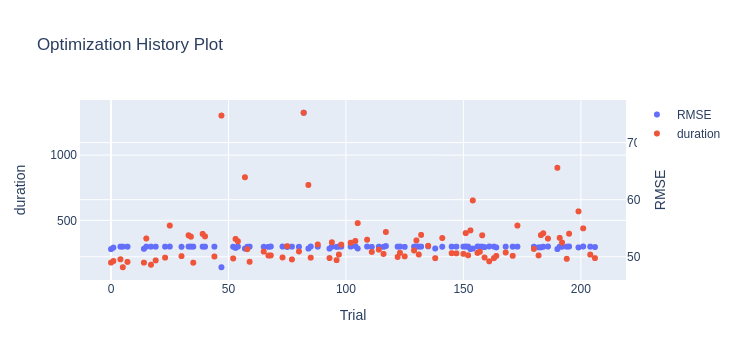

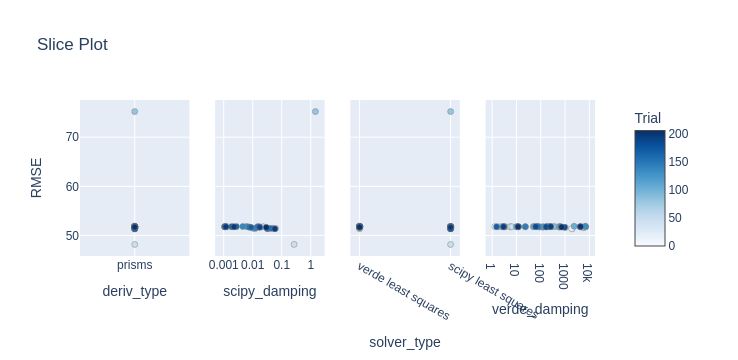

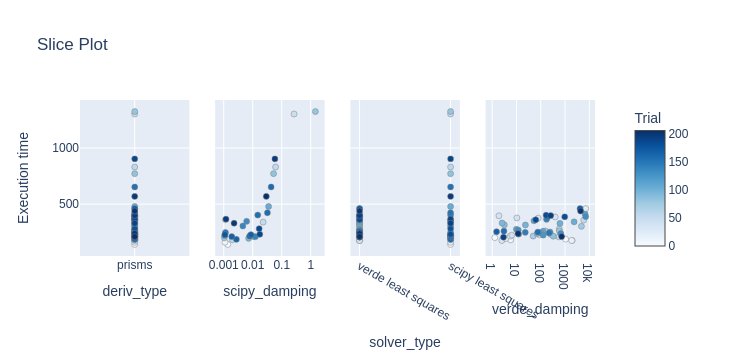

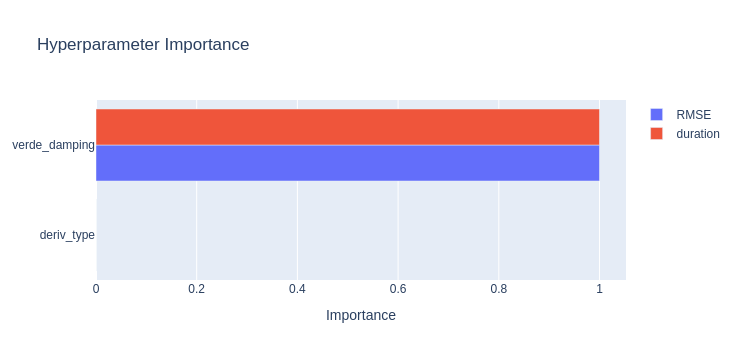

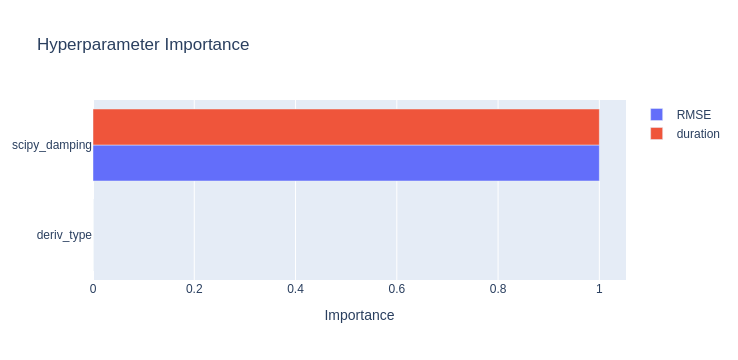

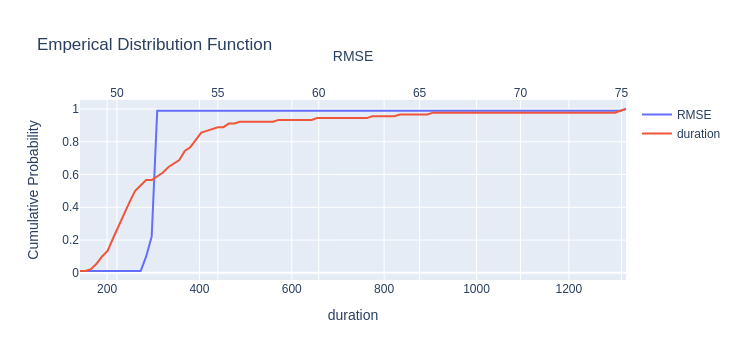

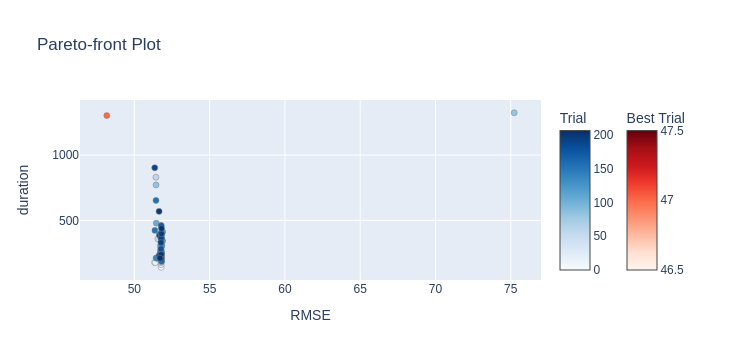

In [20]:
# load and plot past study
study = optuna.load_study(
    study_name=study_name,
    storage=storage,
)

plotting.plot_optuna_inversion_figures(
    study,
    target_names=objectives,
    include_duration=True,
)

In [21]:
start = study.trials_dataframe().sort_values(by="datetime_start").iloc[0].datetime_start
stop = (
    study.trials_dataframe()
    .sort_values(by="datetime_complete", ascending=False)
    .iloc[0]
    .datetime_complete
)

time = stop - start
print(f"Total time for optimization: {time.total_seconds()/60} minutes")

Total time for optimization: 22.163187633333333 minutes


In [22]:
(
    df,
    best_verde,
    best_scipy,
    best_prisms,
    best_annulus,
) = optimization.get_best_of_each_param(study, objectives)
df.sort_values(
    by=[
        "RMSE",
        # "constraints",
        "duration",
    ],
    inplace=True,
)
df.head()

best trial w/ solver = verde: index 0
best trial w/ solver = scipy: index 47
best trial w/ deriv = prisms: index 47
best trial w/ deriv = annulus: index 2


,number,RMSE,datetime_start,datetime_complete,duration,params_deriv_type,params_scipy_damping,params_solver_type,params_verde_damping,state
47,47,48.170642,2023-03-06 22:44:46.186681,2023-03-06 23:06:28.387144,0 days 00:21:42.200463,prisms,0.267398,scipy least squares,NaN,COMPLETE
0,0,51.347543,2023-03-06 22:44:29.016846,2023-03-06 22:47:26.057200,0 days 00:02:57.040354,prisms,NaN,verde least squares,1971.296151,COMPLETE
190,190,51.354144,2023-03-06 22:44:45.706344,2023-03-06 22:59:48.378661,0 days 00:15:02.672317,prisms,0.058162,scipy least squares,NaN,COMPLETE
153,153,51.364491,2023-03-06 22:46:41.793451,2023-03-06 22:53:45.125520,0 days 00:07:03.332069,prisms,0.032107,scipy least squares,NaN,COMPLETE
14,14,51.394152,2023-03-06 22:44:37.666727,2023-03-06 22:47:34.457089,0 days 00:02:56.790362,prisms,NaN,verde least squares,1872.619996,COMPLETE


In [23]:
ind = [trial.number for trial in study.trials].index(best_annulus)
best_params = study.trials[ind].params
print(best_params)

plotting.plot_best_inversion(
    bed,
    buffer_region,
    best_params=best_params,
    grav_spacing=layer_spacing,
    constraint_points=constraint_points,
    # plot_iter_results = False,
    # plot_topo_results = False,
    # plot_grav_results = False,
    **inversion_kwargs
)

{'deriv_type': 'annulus', 'solver_type': 'scipy least squares', 'scipy_damping': 8.439128510922533}


NameError: name 'shape' is not defined

In [160]:
# ind = [trial.number for trial in study.trials].index(best_prisms)
# best_params = study.trials[ind].params
# print(best_params)

# plotting.plot_best_inversion(
#     bed,
#     buffer_region,
#     best_params=best_params,
#     grav_spacing=layer_spacing,
#     constraint_points = constraint_points,
#     # plot_iter_results = False,
#     # plot_topo_results = False,
#     # plot_grav_results = False,
#     **inversion_kwargs
# )

# Repeat with simple noise

The above inversion was able to fully recover Layer 2. This is expected, since there was no noise in the data, and we used a very simple 2 layer model to create the observed gravity. Next we add 2% gaussian noise to $G_{misfit}$ to see how the inversion performs.

In [ ]:
df_anomalies_noise = df_anomalies.copy()

df_anomalies_noise["res"] = synth.contaminate(
    df_anomalies_noise.res,
    stddev=0.02,
    percent=True,
    seed=0,
)
df_anomalies_noise

In [ ]:
# set kwargs for inversion
noise_kwargs = dict(
    input_grav=df_anomalies_noise,
    input_grav_column="Gobs_corr",
    prism_layer=layer2_prisms,
    max_iterations=50,
    l2_norm_tolerance=0.2,
    delta_l2_norm_tolerance=0.8,  # 1.02,
)

In [ ]:
# set name and storage for the optimization
study_name = "2layer_inversion_with_regional_noise_params"
storage = JournalStorage(JournalFileStorage(f"../optimization_logs/{study_name}.log"))

# set number of runs
n_trials = 100

# set objectives
objectives = [
    "RMSE"
    # "duration"
    # "constraints"
]

# set directions
directions = [
    "minimize"
    # "minimize"
    # "minimize"
]

# # create study
# study = optuna.create_study(
#     study_name=study_name,
#     storage=storage,
#     directions=directions,
#     # sampler=optuna.samplers.TPESampler(n_startup_trials=int(n_trials/3)),
#     sampler=optuna.integration.BoTorchSampler(n_startup_trials=int(n_trials/3)),
#     load_if_exists=True,
#     )

# # define the objective function
# objective_func = optimization.optimal_inversion_params(
#     true_layer2,
#     verde_damping_limits = [0, 1e4],
#     scipy_damping_limits = [0, 1],
#     objectives = objectives,
#     constraints = constraint_points,
#     **noise_kwargs)

# # run the optimization
# with inv_utils.HiddenPrints():
#     study, study_df = optimization.optuna_parallel(
#         study_name=study_name,
#         study_storage=storage,
#         objective = objective_func,
#         n_trials=n_trials,
#         maximize_cpus=True,
#     )

In [ ]:
# load and plot past study
study = optuna.load_study(
    study_name=study_name,
    storage=storage,
)

plotting.plot_optuna_inversion_figures(
    study,
    target_names=objectives,
    # include_duration=True,
)

In [ ]:
start = study.trials_dataframe().sort_values(by="datetime_start").iloc[0].datetime_start
stop = (
    study.trials_dataframe()
    .sort_values(by="datetime_complete", ascending=False)
    .iloc[0]
    .datetime_complete
)

time = stop - start
print(f"Total time for optimizaiton: {time.total_seconds()/60} minutes")

In [ ]:
(
    df,
    best_verde,
    best_scipy,
    best_prisms,
    best_annulus,
) = optimization.get_best_of_each_param(study, objectives)
# df.sort_values(by=["RMSE", "constraints", "duration"], inplace=True)
df

In [ ]:
ind = [trial.number for trial in study.trials].index(best_scipy)
best_params = study.trials[ind].params
print(best_params)

plotting.plot_best_inversion(
    true_layer2,
    buffer_region,
    best_params=best_params,
    grav_spacing=grav_spacing,
    constraint_points=constraint_points,
    **noise_kwargs
)

In [ ]:
ind = [trial.number for trial in study.trials].index(best_scipy)
best_params = study.trials[ind].params
print(best_params)

plotting.plot_best_inversion(
    true_layer2,
    buffer_region,
    best_params=best_params,
    grav_spacing=grav_spacing,
    constraint_points=constraint_points,
    **noise_kwargs
)

# Repeat with airborne survey

## Make new gravity dataframe from eq sources

In [ ]:
# dampings = [0.01, 0.1, 1, 10,]
# depths = [5e3, 10e3, 20e3, 50e3]
dampings = np.logspace(-4, 4, num=10)
depths = np.linspace(1e3, 100e3, 10)

import itertools

parameter_sets = [
    dict(damping=combo[0], depth=combo[1])
    for combo in itertools.product(dampings, depths)
]
print("Number of combinations:", len(parameter_sets))

In [ ]:
eq_grav_grid, eq_grav_df = inv_utils.eq_sources_best(
    parameter_sets,
    (airborne_survey_grav.x, airborne_survey_grav.y, airborne_survey_grav.z),
    airborne_survey_grav.Gobs,
    inversion_region,
    airborne_grav_spacing,
    grav_observation_height,
)
grid.plot()

In [ ]:
eq_grav_df = eq_grav_df.rename(columns={"northing": "y", "easting": "x"})
eq_grav_df

## Water gravity

In [ ]:
# calculate gravity of layer1
water_grav_grid, water_grav_df = inv_utils.forward_grav_of_prismlayer(
    [water_prisms],
    eq_grav_df,
    names=["water_prisms"],
    remove_median=True,
    progressbar=True,
    plot=False,
)

eq_grav_df["water_forward"] = water_grav_df.forward_total

# subtract from observed gravity
eq_grav_df["Gobs_corr"] = eq_grav_df["predicted_grav"] - eq_grav_df.water_forward

# center on 0
eq_grav_df["Gobs_corr"] -= eq_grav_df["Gobs_corr"].median()

# grid the results
water_forward = eq_grav_df.set_index(["y", "x"]).to_xarray().water_forward
Gobs_corr = eq_grav_df.set_index(["y", "x"]).to_xarray().Gobs_corr

# center on 0
water_forward -= np.median(water_forward)
Gobs_corr -= np.median(Gobs_corr)
eq_grav_df

# Gravity misfit

The `gravity misfit` is defined as the difference between the observed and predicted gravity:

$G_{misfit} = G_{obs} - G_{forward}$ 

To determine $G_{misfit}$, we need to forward model the gravitational effect of the low-resolution bathymetry density contrast. This will be the input into our inversion.


## Bed gravity

In [ ]:
# calculate gravity of layer1
bed_grav_grid, bed_grav_df = inv_utils.forward_grav_of_prismlayer(
    [bed_prisms],
    eq_grav_df,
    names=["bed_prisms"],
    remove_median=True,
    progressbar=True,
    plot=False,
)

eq_grav_df["bed_forward"] = bed_grav_df.forward_total

# grid the results
bed_forward = eq_grav_df.set_index(["y", "x"]).to_xarray().bed_forward

# center on 0
bed_forward -= np.median(bed_forward)

eq_grav_df

## Save and load results

In [ ]:
eq_grav_df.to_csv(
    "../synthetic_data/Ross_Sea_starting_model_airborne_survey_forward_gravity.csv.gz",
    sep=",",
    na_rep="",
    header=True,
    index=False,
    encoding="utf-8",
    compression="gzip",
)

In [ ]:
eq_grav_df = pd.read_csv(
    "../synthetic_data/Ross_Sea_starting_model_airborne_survey_forward_gravity.csv.gz",
    sep=",",
    header="infer",
    index_col=None,
    compression="gzip",
)

eq_grav_df

## Regional - Residual seperation

The `corrected observed gravity` is the combination of the signal from the density contrasts of `bathymetry` and `basement`. Both of these signals contain long-wavelength components, since both surface have long-wavelength topographic features. The `bathymetry` signal also contains short-wavelength components. Deeper in the crust, further away from the gravity observation points, these short-wavelength components decrease in amplitude. This means the majority the short-wavelength signal in the `corrected observed gravity` is resulting from the density contrast of the `bathymetry`. This is the signal we want to isolate and input into the inversion. 

To do this, we need to seperate the gravity misfit into a `regional` component and a `residual` component. This `regional` field should theoretically contain every gravity signal other than the that resulting from the `bathymetry` surface. Additionaly, this `residual` component should theoretically represent the gravity anomaly due to the difference between the true `bathymetry` and the low-resolution `bathymetry`. 

If we fail to accurately remove the `regional` signal, the resulting `bathymetry` after the inversion will contain long-wavelength topography, resulting from the `regional` gravity field. 

Since we created the synthetic model, we precisely know the regional component (the forward gravity of the `basement`), and can thus tune our regional-residual seperation method to accurately remove the regional field. 

### optimize the regional-residual seperation

We have 4 methods to seperate the regional misfit from the residual misfit.
1) `Filter` method: Apply a low-pass filter to the misfit
2) `Trend` method: Fit a trend to the misfit
3) `Constraints` method: Sample and grid the misfit only at constraint points, where we know the true layer depth
4) `Equivalent-Sources` method: Predict the gravity anomaly resulting from a serious of deep sources.

Each of these methods has 1 parameter to tune. Respectively, these are 
1) gaussian low-pass filter width (1km - 1000km)
2) trend order (1 - 20)
3) gridding tension factor (0 - 1)
4) source depth (10km - 10,000km)

The optimization will explore the parameter space of each of these, and return the parameters which result in your choice of:
a) a `regional misfit` closest to the true layer 3 forward gravity,
b) the smallest `residuals` at the constraint points

Since we know the true `regional` field, we will use method a). For a true inversion where you don't know the `regional` field, you can use method b). This method finds the seperation method which minimize the `residuals` at contraint points. Since at these contraint points you know the starting layer elevation is accurate, the misfit should be entirely due to the `regional` field, and the `residual` should be close to 0. 

Choose to either run all 4 methods in the same optimization, or run each seperately. 

In [ ]:
regional_kwargs = dict(
    input_grav=eq_grav_df,
    input_forward_column="bed_forward",
    input_grav_column="Gobs_corr",
    grav_spacing=airborne_grav_spacing,
    inversion_region=inversion_region,
    true_regional=true_regional_grav,
    constraints=constraint_points,
    block_size=airborne_grav_spacing * 10,
)

## Optimize all methods individually

In [ ]:
# set comparison method
# comparison_method='minimize_constraints'
comparison_method = "regional_comparison"

methods = ["filter", "trend", "constraints", "eq_sources"]

# for i in methods:
#     # set name and storage for the optimization
#     study_name = f"Ross_Sea_regional_seperation_indiv_{i}_{comparison_method}"
#     storage = JournalStorage(JournalFileStorage(f"../optimization_logs/{study_name}.log"))

#     # set number of runs
#     n_trials=50

#     # create a new study
#     study = optuna.create_study(
#         study_name=study_name,
#         storage=storage,
#         direction="minimize",
#         # sampler=optuna.samplers.TPESampler(n_startup_trials=int(n_trials/3)),
#         sampler=optuna.integration.BoTorchSampler(n_startup_trials=int(n_trials/3)),
#         load_if_exists=True,
#         )

#     # define the objective function
#     objective = optimization.optimal_regional_params(
#         comparison_method = comparison_method,
#         regional_method = i,
#         filter_limits = [10e3, 1000e3, 10e3], # 100 options
#         trend_limits = [1, 20, 1], # 20 options
#         constraints_limits = [0, 1, 0.01], # 101 options
#         eq_sources_limits = [10e3, 10000e3, 10e3], # 1000 options
#         **regional_kwargs)

#     # run the optimization
#     with inv_utils.HiddenPrints():
#         with warnings.catch_warnings():
#             warnings.simplefilter("ignore")
#             study, study_df = optimization.optuna_parallel(
#                 study_name=study_name,
#                 study_storage=storage,
#                 objective=objective,
#                 n_trials=n_trials,
#                 maximize_cpus=True,
#             )

In [ ]:
# load studies
study_dfs = []
for i in methods:
    study_name = f"Ross_Sea_regional_seperation_indiv_{i}_{comparison_method}"
    storage = JournalStorage(
        JournalFileStorage(f"../optimization_logs/{study_name}.log")
    )
    study = optuna.load_study(storage=storage, study_name=study_name)
    study_df = study.trials_dataframe()
    study_dfs.append(study_df)

    # plot results
    # plotting.plot_best_param(
    #     study_df,
    #     comparison_method,
    #     regional_method=i,
    #     **regional_kwargs)
    optuna.visualization.plot_slice(study).show()

studies = dict(zip(methods, study_dfs))

for k, v in studies.items():
    v["params_method"] = k

regional_sep_combined_studies = pd.concat(
    studies.values(), ignore_index=True
).sort_values(by="value")

In [ ]:
df = regional_sep_combined_studies
df.head()

In [ ]:
best_filter = df[df.params_method == "filter"].iloc[0].number
best_trend = df[df.params_method == "trend"].iloc[0].number
best_constraints = df[df.params_method == "constraints"].iloc[0].number
best_eq_sources = df[df.params_method == "eq_sources"].iloc[0].number

print(f"best trial w/ method = filter: index {best_filter}")
print(f"best trial w/ method = trend: index {best_trend}")
print(f"best trial w/ method = constraints: index {best_constraints}")
print(f"best trial w/ method = eq. sources: index {best_eq_sources}")

## Best regional seperation

In [ ]:
# choose the regional method:
# regional_method = "filter"
# regional_method = "trend"
regional_method = "constraints"
# regional_method = "eq_sources"
# regional_method = df.params_method.iloc[0]

# set the parameter:
# contraints: 1 results in pedastals, 0 is good,
param = 0.23  # 1000e3

# or use the best parameter from the optimization
# param = df[df[f"params_{regional_method}"].notnull()].iloc[0][f"params_{regional_method}"]

df_anomalies = regional.regional_seperation(
    regional_method=regional_method,
    filter=f"g{param}",
    trend=param,
    tension_factor=param,
    eq_sources=param,
    **regional_kwargs,
)

anom_grids = plotting.anomalies_plotting(
    df_anomalies,
    region=inversion_region,
    grav_spacing=airborne_grav_spacing,
    title=f" Method: {regional_method}, parameter: {param}",
    # constraints=constraint_points,
    input_forward_column="bed_forward",
    input_grav_column="Gobs_corr",
)

# Inversion

Now that we have $G_{misfit}$, we can run an inversion to attempt to recover the true Layer 2 topography. 

To determine optimal inversion parameters, we will run an optimization routine which minimizes the root median square error (RMSE) of the ending Surface 2 to the true Surface 2. 

The parameters we will test are:
* Jacobian methods (annulus vs small prisms)
* Solver methods (Scipy lsqr vs Verde lsqr)
* Solver damping
* max prism change per iteration

In [ ]:
# set kwargs for inversion
inversion_kwargs = dict(
    input_grav=df_anomalies,
    input_grav_column="Gobs_corr",
    prism_layer=bed_prisms,
    max_iterations=100,
    l2_norm_tolerance=0.2,
    delta_l2_norm_tolerance=0.8,
)

In [ ]:
# # %%snakeviz

# prism_results, grav_results, params, elapsed_time = inv.geo_inversion(
#     **inversion_kwargs,

#     deriv_type = "annulus",
#     # deriv_type = "prisms",

#     solver_type = "verde least squares",
#     # solver_type = "scipy least squares",

#     # solver_damping = 1000000,
#     # solver_damping = 1000000
#         )

In [ ]:
# grids = plotting.plot_inversion_results(
#     grav_results,
#     prism_results,
#     params,
#     grav_region=inversion_region,
#     grav_spacing=layer_spacing,
#     constraints=constraint_points,
#     plot_topo_results=False,
#     plot_grav_results=False,
#     iters_to_plot=4,
#     )

In [ ]:
# set name and storage for the optimization
study_name = "Ross_Sea_inversion_with_regional_airborne_survey_params"
storage = JournalStorage(JournalFileStorage(f"../optimization_logs/{study_name}.log"))

# set number of runs
n_trials = 20

# set objectives
objectives = [
    "RMSE"
    # "duration"
    # "constraints"
]

# set directions
directions = [
    "minimize"
    # "minimize"
    # "minimize"
]

# create study
study = optuna.create_study(
    study_name=study_name,
    storage=storage,
    directions=directions,
    # sampler=optuna.samplers.TPESampler(n_startup_trials=int(n_trials/3)),
    sampler=optuna.integration.BoTorchSampler(n_startup_trials=int(n_trials / 3)),
    load_if_exists=True,
)

# define the objective function
objective_func = optimization.optimal_inversion_params(
    lowres_bed,
    verde_damping_limits=[0, 1e4],
    scipy_damping_limits=[0, 1],
    objectives=objectives,
    constraints=constraint_points,
    **inversion_kwargs,
)

# run the optimization
with inv_utils.HiddenPrints():
    study, study_df = optimization.optuna_parallel(
        study_name=study_name,
        study_storage=storage,
        objective=objective_func,
        n_trials=n_trials,
        maximize_cpus=True,
    )

In [ ]:
# load and plot past study
study = optuna.load_study(
    study_name=study_name,
    storage=storage,
)

plotting.plot_optuna_inversion_figures(
    study,
    target_names=objectives,
    include_duration=True,
)

In [ ]:
start = study.trials_dataframe().sort_values(by="datetime_start").iloc[0].datetime_start
stop = (
    study.trials_dataframe()
    .sort_values(by="datetime_complete", ascending=False)
    .iloc[0]
    .datetime_complete
)

time = stop - start
print(f"Total time for optimizaiton: {time.total_seconds()/60} minutes")

In [ ]:
(
    df,
    best_verde,
    best_scipy,
    best_prisms,
    best_annulus,
) = optimization.get_best_of_each_param(study, objectives)
# df.sort_values(by=["RMSE", "constraints", "duration"], inplace=True)
df

In [ ]:
ind = [trial.number for trial in study.trials].index(best_annulus)
best_params = study.trials[ind].params
print(best_params)

plotting.plot_best_inversion(
    bed,
    buffer_region,
    best_params=best_params,
    grav_spacing=airborne_grav_spacing,
    constraint_points=constraint_points,
    **inversion_kwargs
)

In [ ]:
ind = [trial.number for trial in study.trials].index(best_prisms)
best_params = study.trials[ind].params
print(best_params)

plotting.plot_best_inversion(
    bed,
    buffer_region,
    best_params=best_params,
    grav_spacing=airborne_grav_spacing,
    constraint_points=constraint_points,
    **inversion_kwargs
)